In [1]:
import networkx as nx
import numpy as np
import torch
from torch.nn import Parameter
import matplotlib.pyplot as plt
import random 
import math
import pandas as pd

# Functions

In [347]:
def hid_var_dag(latent=2,observed=5,dag_type = 'default',parents_max = 3,
                expected_degree=3):
    
    """
        Generate random Directed Acyclic Graphs (DAGs) with hidden variables.
        
        Parameters:
        - latent (int): Number of hidden variables.
        - observed (int): Number of observed variables.
        - dag_type (str): Type of DAG to generate ('default' or 'erdos').
        - parents_max (int): Maximum number of parents for observed variables in the 'default' DAG type.
        - expected_degree (int): Expected degree of nodes in the 'erdos' DAG type.
        
        Returns:
        - g (nx.DiGraph): Generated DAG as a NetworkX DiGraph object.
        
    """
    
    adj = np.zeros((latent+observed, latent+observed))
    for i in range(latent):
        obs_ch = np.random.randint(latent,latent+observed,np.random.randint(2,observed+1))
        for j in obs_ch:
            adj[i,j] = 1;
            
    if dag_type == 'default':
        for j in range(1, observed):
            nb_parents = np.random.randint(0, min([parents_max, j])+1)
            for i in np.random.choice(range(0, j), nb_parents, replace=False):
                adj[latent+i,latent+j] = 1

    elif dag_type == 'erdos':
        nb_edges = expected_degree * observed
        prob_connection = 2 * nb_edges/(observed**2 - observed)
        causal_order = np.random.permutation(np.arange(observed))

        for i in range(observed - 1):
            node = causal_order[i]
            possible_parents = causal_order[(i+1):]
            num_parents = np.random.binomial(n=observed - i - 1,
                                             p=prob_connection)
            parents = np.random.choice(possible_parents, size=num_parents,
                                       replace=False)
            adj[latent+parents,latent+node] = 1      
            
    g = nx.DiGraph(adj)            
    return g





def par_gen(latent=2,observed=5,g = None,g_adj = None, same_var = True, v_min = 0.2, v_max = 10, stn_ratio = 1, w_max = 10):
    
    varr = par_gen_var(latent=latent,observed=observed,g = g, g_adj = g_adj, same_var = same_var, v_min = v_min, v_max = v_max, stn_ratio = stn_ratio)
    
    weight, B = par_gen_weights(latent=latent,observed=observed,g = g, w_max = w_max)
    
    return varr, weight, B


def par_gen_var(latent=2,observed=5,g = None, g_adj = None, same_var = True, v_min = 0.2, v_max = 10, stn_ratio = 1):
    
    varr = torch.Tensor(len(g.nodes()))
    if same_var == 'True':
        varr[range(latent)] = torch.ones(observed)
        varr[range(latent,latent+observed)] = torch.ones(observed)
        
    else:
        varr[range(latent)] = torch.Tensor(latent).uniform_(v_lat_min,v_lat_max)
        varr[range(latent, latent+observed)] = torch.Tensor(observed).uniform_(v_min,v_max)
        for i in range(latent):
            j = latent
            find_first_ch = True
            while(j<observed and find_first_ch == False):
                if (g_adj[i, j] == 1):
                    find_first_ch = True
                j += 1
            if find_first_ch == False:
                varr[i] = torch.Tensor(1).uniform_(v_min,v_max)
            else:
                varr[i] = varr[j]*stn_ratio
    
    return varr

def par_gen_weights(latent=2,observed=5,g = None, w_max = 10):
    
    weight = torch.Tensor(len(g.edges())).uniform_(-w_max,w_max)
    
    adj = torch.eye(len(g.nodes()))
    for e in range(len(g.edges())):
        adj[list(g.edges)[e]]=-weight[e]
    B = (torch.inverse(adj)).t()
    
    return weight, B




def hid_var_data(latent=2,observed=5,g = None, n = 500, B = None,
                distr = 'Laplace', varr = torch.ones(7)):
    """
    Generate, possibly whitened, data from a given DAG.
    
    Parameters:
        - latent (int): Number of hidden variables.
        - observed (int): Number of observed variables.
        - g (nx.DiGraph): The DAG as a NetworkX DiGraph object.
        - n (int): Number of data samples to generate.
        - withening (bool): Flag to apply whitening to the data.
        - distr(string): 'Laplace' or 'Cauchy'
        - same_var(bool): True if the noise terms must have the same variance
    
    Returns:
        - data (torch.Tensor): Generated data.
        - adj (torch.Tensor): Adjacency matrix of the DAG.
        - W_with (torch.Tensor): Whitening matrix (if applicable otherwise identity matrix).
        - weight (torch.Tensor): Weights associated with the DAG edges.
    
    """
    
    err = torch.Tensor(latent+observed,n)
    
    for j in range(latent+observed):
        for i in range(n):
            if distr == 'Laplace':
                err[j,i] = torch.distributions.laplace.Laplace(0,1).sample()*varr[j]
            elif distr == 'Cauchy':
                err[j, i] = torch.Tensor(1).cauchy_()*varr[j]
            elif distr == 'Normal':
                err[j, i] = torch.Tensor(1).normal_()*varr[j]
            else:
                print(dis , 'error')
                break
                
    
    
    #err = torch.Tensor(latent+observed,n).cauchy_()
    data = B.matmul(err).t()
    data = data[:,range(latent, observed+latent)]
    
    return data


def init_w_guess(data, g, latent, observed, W_with):
    up_data = W_with.inverse().matmul(data.t())
    w = torch.zeros(len(g.edges()))
    mask = torch.zeros(len(g.edges()))

    for i, e in enumerate(g.edges()):
        if e[0] < latent:
            w[i] = torch.Tensor(1).normal_().item()
            mask[i] = 1
        else:
            G_cov = up_data.cov()
            w[i] = G_cov[e[0]-latent,e[1]-latent]/G_cov[e[0]-latent,e[0]-latent]
            up_data[:, e[1]-latent] = up_data[:, e[1]-latent]-w[i]*up_data[:,e[0]-latent]

            an_s = sorted(nx.ancestors(g, e[0]))
            i_s = intersection(an_s,list(range(latent)))

            if len(i_s) > 0 :
                an_t = sorted(nx.ancestors(g, e[1]))
                i_t = intersection(an_t,list(range(latent)))
                if len(i_t)>0:
                    ints = intersection(i_s,i_t)
                    if len(ints)>0:
                        mask[i] = 1
    return w, mask    


def intersection(lst1, lst2):
    lst3 = [value for value in lst1 if value in lst2]
    return lst3

def graphical_rica(withening = True, pseudoinv = False, latent = 3, observed = 2, g = None, g_adj = None,  data = None, moms = [0, 0.3], lambdas = [0, 0.3], epochs = 2000, lr = 0.1, w_init = 'random', w_true = torch.zeros(5), cti_sd = 1, g_struc = True):
    
    """
        Graphical adaptation of RICA
        
        Parameters:
            - latent (int): Number of hidden variables.
            - observed (int): Number of observed variables.
            - g (nx.DiGraph): The DAG as a NetworkX DiGraph object.
            - data (torch.Tensor): Input data.
            - lr(double): Learning rate of the optimizer.
            - moms (list): List of momentum values for optimization.
            - lambdas (list): List of regularization lambda values for optimization.
            - epochs (int): Number of optimization epochs.
            - W_with (torch.Tensor): Whitening matrix.
            - w_init (str): Weight initialization strategy ('random', 'true', 'cov_guess').
            - w_true (torch.Tensor): True weights of the DAG edges.
        
        Returns:
            - loss_data (torch.Tensor): Loss data during optimization.
            - w_loss_data (torch.Tensor): Squared distance of the difference between the true and the estimated parameters during optimization.
            
        """
    
    data = data - data.mean(0)
    
    if withening == True:
        d_cov = (data.t()).cov()
        U, S, V = d_cov.svd()
        S_2=torch.inverse(torch.diag(S.sqrt()))
        W_with = S_2.matmul(V.t())
        data = W_with.matmul(data.t()).t()
    else:
        W_with = torch.eye(observed)
        
    loss_data = torch.zeros(len(moms),len(lambdas),epochs)
    w_loss_data = torch.zeros(len(g.edges()),len(moms),len(lambdas),epochs)
    #B_est = torch.zeros(observed,latent+observed, len(moms),len(lambdas),epochs)

                
    for i in range(len(moms)):
        for j in range(len(lambdas)):
            
            if g_struc == True:
                if w_init == 'random':
                    weight = Parameter(torch.Tensor(len(g.edges())).normal_(0,4))
                elif w_init == 'cov_guess':
                    w, mask = init_w_guess(data, g, latent, observed, W_with)
                    weight = Parameter(w[mask == 1])
                    fix_weight = w[mask == 0]        
                    c_list = count_lists(mask)
                elif w_init == 'cti':
                    ct = torch.Tensor(len(g.edges())).normal_(0,cti_sd)
                    weight = Parameter((torch.clone(w_true).detach()+ct).requires_grad_(True))
                else:
                    weight = Parameter(torch.clone(w_true).detach().requires_grad_(True))


                mom = moms[i]
                lambd = lambdas[j]
                optimizer = torch.optim.RMSprop([weight], lr, momentum=mom)
            else:
                weight = Parameter(torch.Tensor(observed, latent+observed).normal_(0,4))
                
                mom = moms[i]
                lambd = lambdas[j]
                optimizer = torch.optim.RMSprop([weight], lr, momentum=mom)

            for epoch in range(epochs):
                
                if g_struc == True:
                    adj = torch.eye(len(g.nodes()))
                    if w_init == 'cov_guess':
                        for ii, e in enumerate(g.edges()):
                            if mask[ii] == 1:
                                adj[e]=-weight[int(c_list[ii])]
                            else:
                                adj[e]=-fix_weight[int(c_list[ii])]

                    else:
                        for e in range(len(g.edges())):
                            adj[list(g.edges)[e]]=-weight[e]

                    B = (torch.inverse(adj)).t()
                    B = B[latent:latent+observed,:]
                    B = W_with.matmul(B)

                    if pseudoinv == True:
                        BB = ((B.matmul(B.t())).inverse()).matmul(B)
                    else:
                        BB = B
                    latents = data.matmul(BB)
                    output = latents.matmul(BB.t())



                    diff = output - data
                    loss_recon = (diff * diff).mean()
                    loss_latent = latents.abs().mean()
                    loss =lambd * loss_recon + loss_latent


                    loss_data[i, j, epoch] =  (loss.data).detach().item()

                    #B_est[:, :, i, j, epoch] =  BB

                    if  w_init == 'cov_guess':
                        #w_loss_data[mask==1,i,j, epoch] = (weight-torch.tensor(w_true[mask==1])).square()
                        w_loss_data[mask==1,i,j, epoch] = (weight-w_true[mask==1].clone().detach()).abs()
                        #w_loss_data[mask==0,i,j, epoch] = (fix_weight-torch.tensor(w_true[mask==0])).square()
                        w_loss_data[mask==0,i,j, epoch] = (fix_weight-w_true[mask==0].clone().detach()).abs()
                    else:
                        w_loss_data[:,i,j, epoch] = (weight-w_true.clone().detach())
                        #w_loss_data[:,i,j, epoch] = weight.clone().detach()

                    optimizer.zero_grad()
                    loss.backward()
                    optimizer.step()
                else:
                    B = weight
                    
                    latents = data.matmul(BB)
                    output = latents.matmul(BB.t())



                    diff = output - data
                    loss_recon = (diff * diff).mean()
                    loss_latent = latents.abs().mean()
                    loss =lambd * loss_recon + loss_latent


                    loss_data[i, j, epoch] =  (loss.data).detach().item()
                    
                    optimizer.zero_grad()
                    loss.backward()
                    optimizer.step()
                    


    return loss_data, w_loss_data


def from_B_to_weight(g, g_adj, latent, observed, B):
    BB = B.clone().detach().requires_grad_(True)
    for i, node in enumerate(range(latent+observed)):
        j = latent
        find_ch = False
        while(find_ch == False and j < observed):
            if g_adj[i, j] == 1:
                BB[:, i] = BB[:, i]/BB[j, i]
                find_ch = True
            j += 1
    B_obs = BB[:,range(latent, latent+observed)]
    adj = B_obs.inverse()
    weight = []
    for i in range(latent, latent+observed):
        for j in range(i+1, latent+observed):
            if g_adj[i, j] == 1:
                weight.append(adj[i,j])
    
    return weight
                        
            

def count_lists(l):
    c_m = -1
    c_um = -1
    c_list = np.zeros(len(l))
    for i, e in enumerate(l):
        if l[i] == 0:
            c_um = c_um+1
            c_list[i] = c_um
        else:
            c_m = c_m+1
            c_list[i] = c_m
    return c_list
    
    
def loss_plots(loss_data, w_loss_data, moms, lambdas, epochs,lrs, inits, w_true, w_of_int):
    """
    Generate and display plots.

    Parameters:
    - loss_data (torch.Tensor): Loss data during optimization.
    - loss_recon_data (torch.Tensor): Reconstruction loss data during optimization.
    - loss_latent_data (torch.Tensor): Latent loss data during optimization.
    - w_loss_data (torch.Tensor): Weight loss data during optimization.
    - moms (list): List of momentum values.
    - lambdas (list): List of regularization lambda values.
    - epochs (int): Number of optimization epochs.
    """
    for llr, lr in enumerate(lrs):
        for l, ll in enumerate(inits):
            fig, axs = plt.subplots(len(moms), len(lambdas), figsize=(12, 8))
            #print(f' True coefficients : {w_true[2:4]}, loss 2stlq: {w_2stg}')
            #print(f' True coefficients : {w_true[w_of_int]}')
            
            # Create a list to store legend handles and labels
            legend_handles, legend_labels = [], []

            for i in range(len(moms)):
                for j in range(len(lambdas)):

                    x = range(epochs)

                    # Plot on the current subplot
                    ax1 = axs[i, j]
                    line1, = ax1.plot(x, loss_data[:,llr, l, i, j, :].log().mean(0), 'b-', label='Loss Data')
                    ax1.set_xlabel('Epochs')
                    ax1.set_ylabel('Loss Data', color='b')
                    ax1.tick_params('y', colors='b')

                    # Create a second y-axis on the same subplot
                    ax2 = ax1.twinx()
                    lines2 = []

                    #for k in range(2):
                    for k in w_of_int:
                        ww = torch.Tensor(epochs)
                        ww_std = torch.Tensor(epochs)
                        for e in range(epochs):
                            ww[e] = (w_loss_data[:,llr, l,  k, i, j, e]/w_true[:, llr, l, k]).abs().mean()
                            #ww_std[e] = (w_loss_data[:, llr, l, k, i, j, e]/w_true[:, llr, l, k]).abs().std()

                        line2, = ax2.plot(x, ww.detach().numpy(), linestyle='--', label=f'W_{k} Loss')
                        
                        lines2.append(line2)
                    ax2.set_ylabel('W Loss', color='r')
                    ax2.tick_params('y', colors='r')



                    ax1.set_title(f'LR:{lr}, Init: {ll}, Lambda: {lambdas[j]}, Mom: {moms[i]}')
                    #print(f'Lambda: {lambdas[j]}, Mom: {moms[i]}, Loss at minimum : {(w_loss_data[w_of_int,i,j,loss_data[i, j, :].argmin()]/w_true[k]).abs()}')

            # Create a common legend outside the subplots
            # Extend the legend handles and labels

            legend_handles.extend([line1] + lines2)
            legend_labels.extend(['Loss Data'] + [f'W_{k} Loss' for k in w_of_int])
            fig.legend(legend_handles, legend_labels, bbox_to_anchor=(0.6, 0.5, 0.5, 0.5))

            
            # Adjust layout and display the plots
            plt.tight_layout()
            plt.show()

# Underspecified Treatment

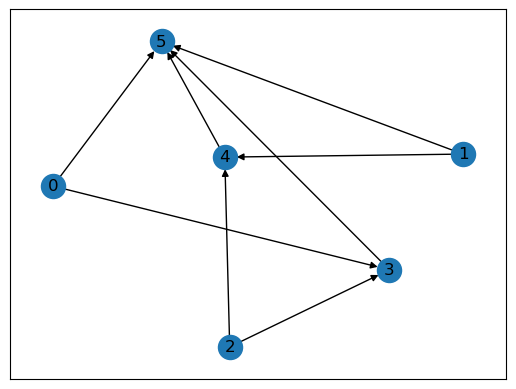

In [326]:
un_iv_adj = np.array([[0,0,0,1,0,1],[0,0,0,0,1,1],[0,0,0,1,1,0],[0,0,0,0,0,1],[0,0,0,0,0,1],[0,0,0,0,0,0]])
un_g = nx.DiGraph(un_iv_adj)

nx.draw_networkx(un_g)
latent = 2
observed = 4
W_of_int = [6,7]

# Withening Vs No-Withening

In [327]:
w_inits = ['given']
dis = 'Laplace'
s_var = False 
lambdas = [0, 0.3]
moms = [0, 0.3]
epochs = 2500
n = 1000
reps = 10
lrs= [0.1]

v_min = 0.2
v_max = 5

v_lat_min = 0.2
v_lat_max = 5

w_max = 5
stn_ratios = [0.1, 1, 10, 100]

lr = 0.1

l_data_with = torch.zeros(reps, len(lrs), len(stn_ratios),3, len(moms),len(lambdas),epochs)
w_l_data_with = torch.zeros(reps, len(lrs), len(stn_ratios),3, len(un_g.edges()),len(moms),len(lambdas),epochs)

l_data_no_with = torch.zeros(reps, len(lrs), len(stn_ratios),3, len(moms),len(lambdas),epochs)
w_l_data_no_with = torch.zeros(reps, len(lrs), len(stn_ratios),3, len(un_g.edges()),len(moms),len(lambdas),epochs)

w_t_with = torch.zeros(reps, len(lrs), len(stn_ratios),3, len(un_g.edges()))

In [337]:
for r in range(reps):
    for l, stn_ratio in enumerate(stn_ratios):
        varr, w_true, B_true = par_gen(latent = latent,observed = observed, g= un_g, g_adj = un_iv_adj,  same_var = s_var, v_min = v_min,
                                               v_max = v_max, w_max = w_max, stn_ratio = stn_ratio)
        data = hid_var_data(latent, observed, un_g ,n, B_true, distr = dis, varr = varr)
        for i, w_init in enumerate(w_inits):
            for j, lr in enumerate(lrs):
                w_t_with[r, j, l, i, :] = w_true

                
                l_data_with[r,j, l, i, :, :, :], w_l_data_with[r,j, l,i, : ,:, :, :] = graphical_rica(withening = False, pseudoinv = False, latent = latent, observed = observed,
                                                                                                      g = un_g, data = data, moms = moms, lambdas = lambdas,
                                                                                                      epochs = epochs, lr = lr, w_init = w_init,
                                                                                                      w_true = w_true, cti_sd = 1) 
                
                l_data_no_with[r, j, l, i, :, :, :], w_l_data_no_with[r,j, l, i,  : ,:, :, :] = graphical_rica(withening = True, pseudoinv = False, latent = latent, observed = observed,
                                                                                                               g = un_g, data = data, moms = moms, lambdas = lambdas, 
                                                                                                               epochs = epochs, lr = lr, w_init = w_init, 
                                                                                                               w_true = w_true, cti_sd = 1) 

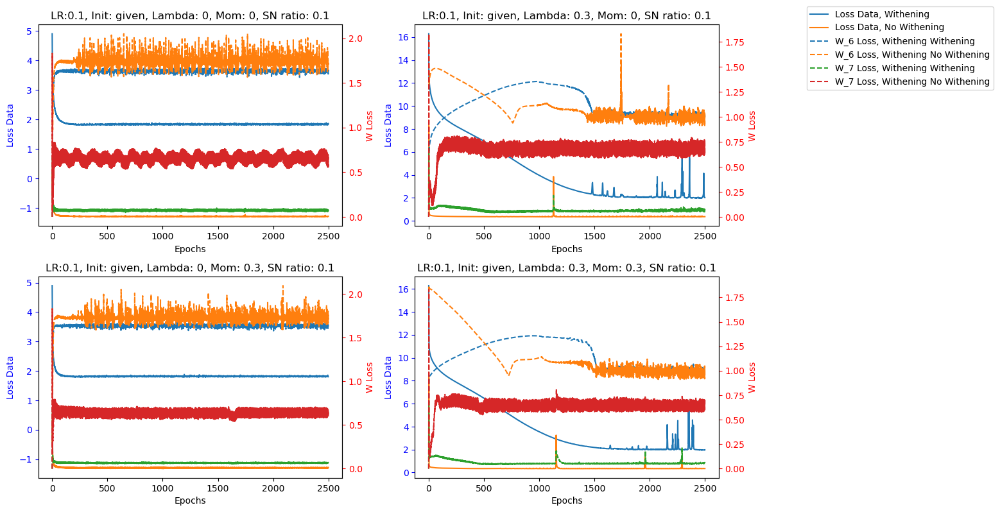

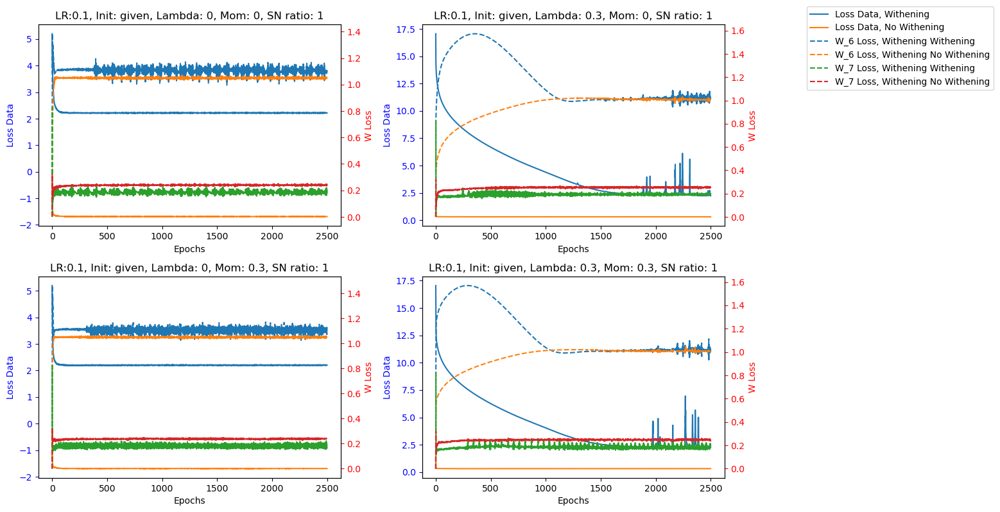

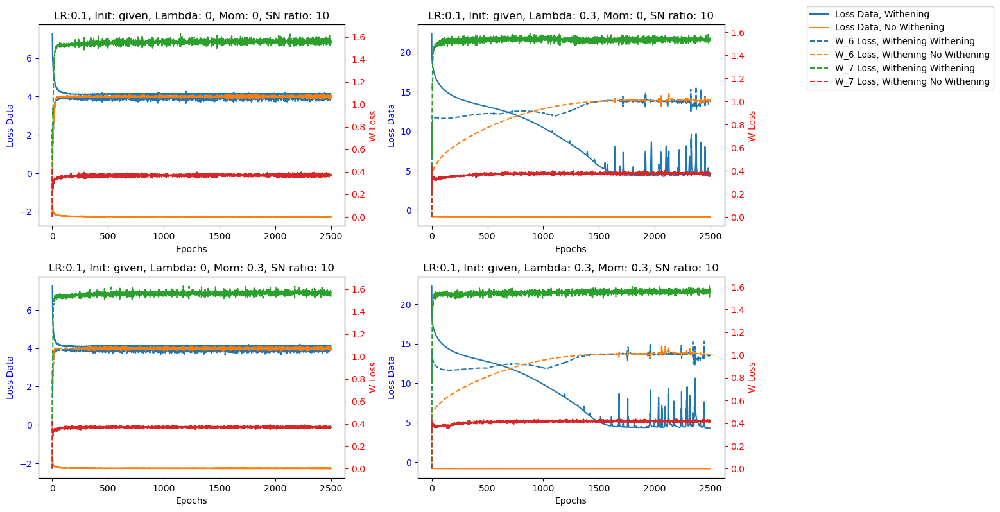

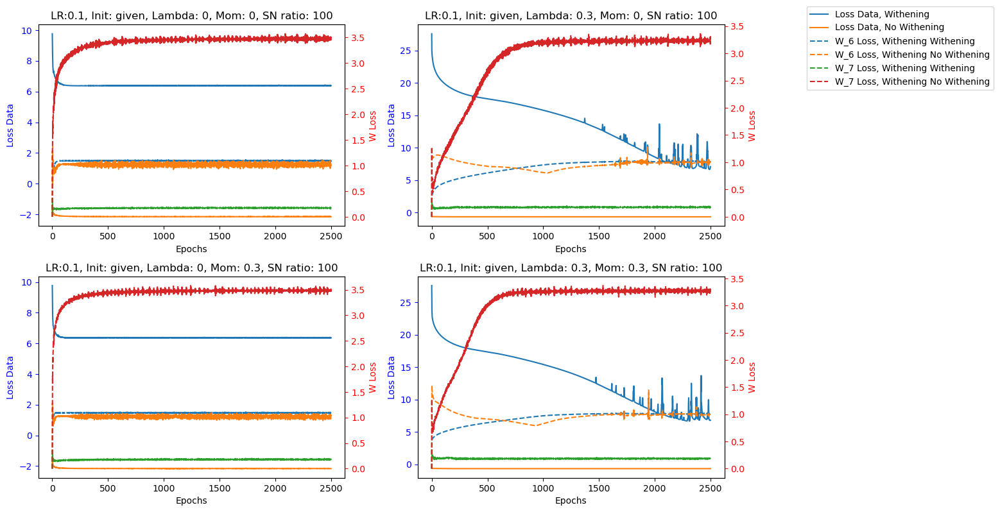

In [338]:
loss_datas = [l_data_with, l_data_no_with] 
w_loss_datas = [w_l_data_with, w_l_data_no_with]
inits = ['given']
w_true = [w_t_with, w_t_with]
w_of_int = [6,7]
lrs= [0.1]

dic = ["Withening", "No Withening"]

N = epochs

x = range(epochs-N, epochs)

for llr, lr in enumerate(lrs):
    for l, ll in enumerate(inits):
        for m, mm in enumerate(stn_ratios):            
            fig, axs = plt.subplots(len(moms), len(lambdas), figsize=(12, 8))
            #print(f' True coefficients : {w_true[2:4]}, loss 2stlq: {w_2stg}')
            #print(f' True coefficients : {w_true[w_of_int]}')

            # Create a list to store legend handles and labels
            legend_handles, legend_labels = [], []
            lines = []

            for i in range(len(moms)):
                for j in range(len(lambdas)):

                    
                    # Plot on the current subplot
                    ax1 = axs[i, j]
                    for l_enum, loss_data in enumerate(loss_datas):
                        line1, = ax1.plot(x, loss_data[:, llr, m, l, i, j, :].mean(0).log().detach().numpy(), '-', label=f'Loss Data, {dic[l_enum]}')
                        lines.append(line1)
                    ax1.set_xlabel('Epochs')
                    ax1.set_ylabel('Loss Data', color='b')
                    ax1.tick_params('y', colors='b')
                    
                    # Create a second y-axis on the same subplot
                    ax2 = ax1.twinx()
                    
                    for w_l_enum, w_loss_data in enumerate(w_loss_datas):
                        w_t = w_true[w_l_enum]
                        for k in w_of_int:
                            ww = torch.Tensor(epochs)
                            for e in range(epochs):
                                ww[e] = (w_loss_data[:,llr, m, l, k, i, j, e]/w_t[:, llr, m,  l, k]).abs().mean()
                            
                            line2, = ax2.plot(x, ww.detach().numpy(), linestyle='--', label=f'W_{k} Loss,  Withening {dic[w_l_enum]} ')
                            lines.append(line2)
                    ax2.set_ylabel('W Loss', color='r')
                    ax2.tick_params('y', colors='r')



                    ax1.set_title(f'LR:{lr}, Init: {ll}, Lambda: {lambdas[j]}, Mom: {moms[i]}, SN ratio: {mm}')
                    #print(f'Lambda: {lambdas[j]}, Mom: {moms[i]}, Loss at minimum : {(w_loss_data[w_of_int,i,j,loss_data[i, j, :].argmin()]/w_true[k]).abs()}')

            # Create a common legend outside the subplots
            # Extend the legend handles and labels

            legend_handles.extend(lines)
            legend_labels.extend([f'Loss Data, {dic[l_enum]}' for l_enum in range(2)] + [f'W_{k} Loss, Withening {dic[w_l_enum]}' for k in w_of_int for w_l_enum in range(2)])
            fig.legend(legend_handles, legend_labels, bbox_to_anchor=(0.8, 0.5, 0.5, 0.5))


            # Adjust layout and display the plots
            plt.tight_layout()
            plt.show()

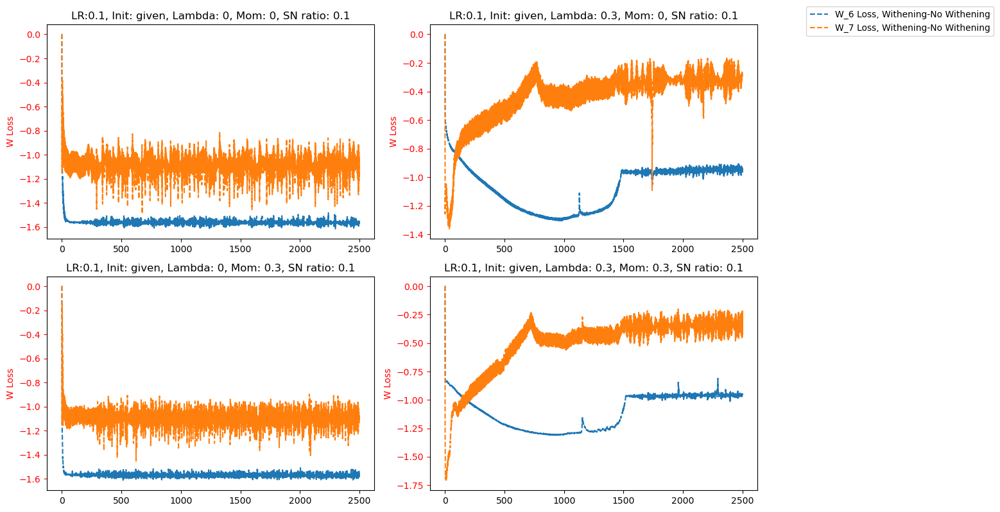

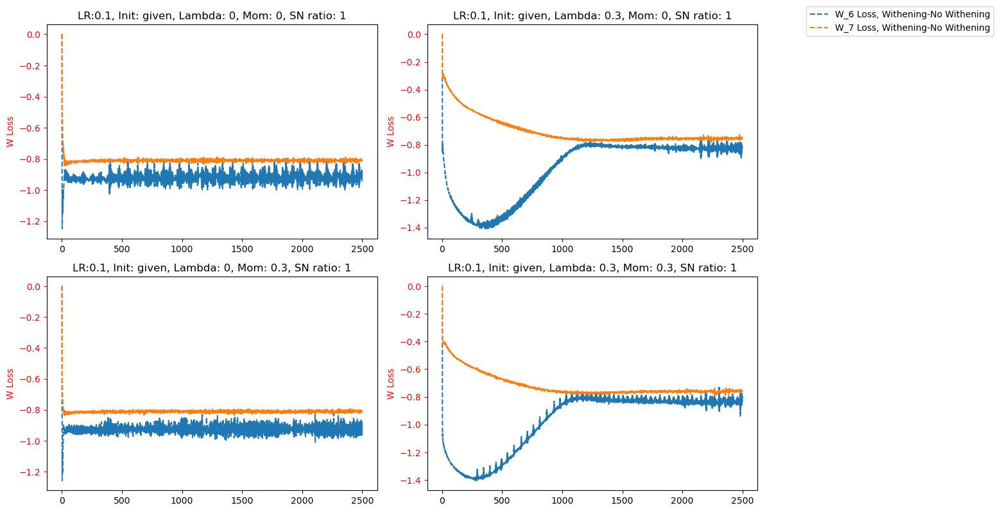

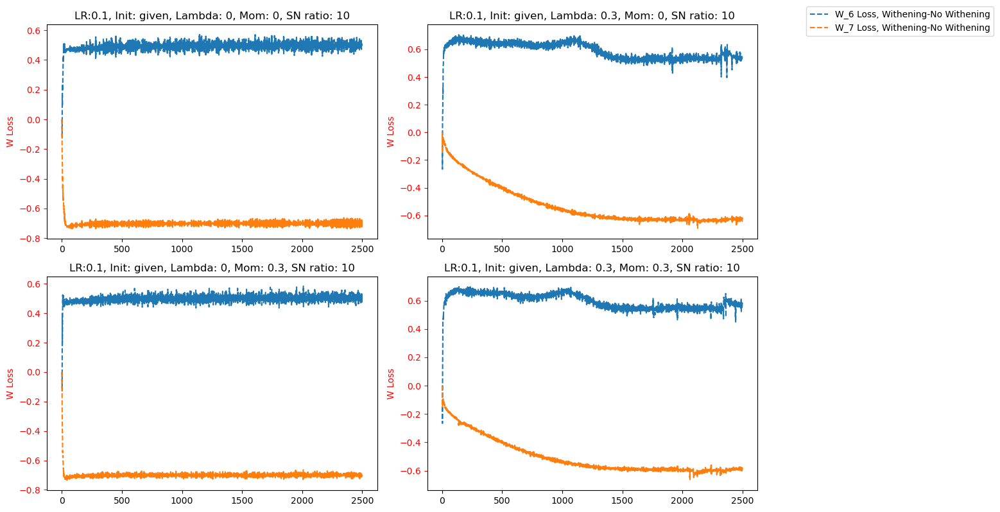

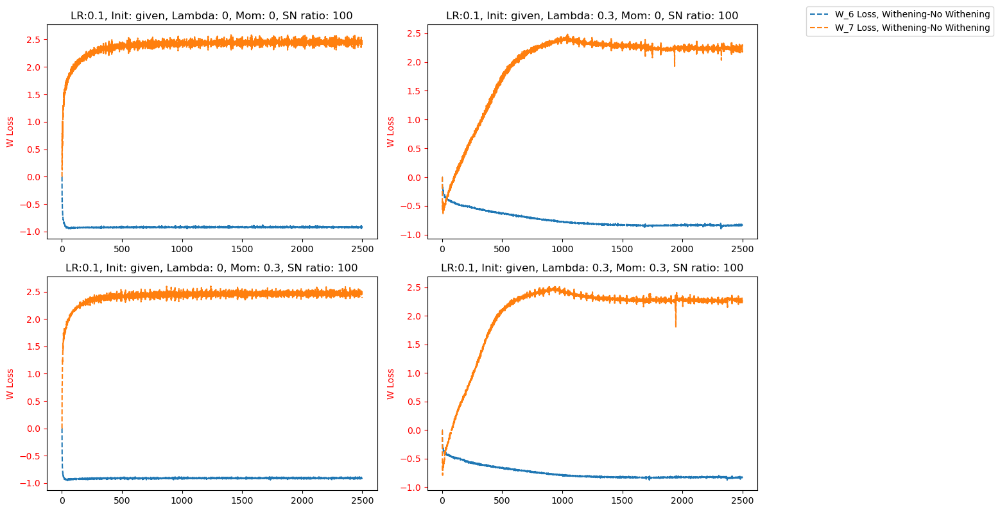

In [339]:
loss_datas = [l_data_with, l_data_no_with] 
w_loss_datas = [w_l_data_with, w_l_data_no_with]
inits = ['given']
w_true = [w_t_with, w_t_with]
w_of_int = [6,7]
lrs= [0.1]


dic = ["Withening", "No Withening"]

N = epochs

x = range(epochs-N, epochs)

for llr, lr in enumerate(lrs):
    for l, ll in enumerate(inits):
        for m, mm in enumerate(stn_ratios):            
            fig, axs = plt.subplots(len(moms), len(lambdas), figsize=(12, 8))
            #print(f' True coefficients : {w_true[2:4]}, loss 2stlq: {w_2stg}')
            #print(f' True coefficients : {w_true[w_of_int]}')

            # Create a list to store legend handles and labels
            legend_handles, legend_labels = [], []
            lines = []

            for i in range(len(moms)):
                for j in range(len(lambdas)):

                    
                    # Plot on the current subplot
                    ax1 = axs[i, j]                    
                    w_t = w_true[0]
                    for k in w_of_int:
                        ww = torch.Tensor(epochs)
                        for e in range(epochs):
                            ww[e] = ((w_loss_datas[1][:,llr, m, l, k, i, j, e]/w_t[:, llr, m,  l, k]).abs()-(w_loss_datas[0][:,llr, m, l, k, i, j, e]/w_t[:, llr, m,  l, k]).abs()).mean()

                        line2, = ax1.plot(x, ww.detach().numpy(), linestyle='--', label=f'W_{k} Loss,  Withening-No Withening')
                        lines.append(line2)
                    ax1.set_ylabel('W Loss', color='r')
                    ax1.tick_params('y', colors='r')



                    ax1.set_title(f'LR:{lr}, Init: {ll}, Lambda: {lambdas[j]}, Mom: {moms[i]}, SN ratio: {mm}')
                    #print(f'Lambda: {lambdas[j]}, Mom: {moms[i]}, Loss at minimum : {(w_loss_data[w_of_int,i,j,loss_data[i, j, :].argmin()]/w_true[k]).abs()}')

            # Create a common legend outside the subplots
            # Extend the legend handles and labels

            legend_handles.extend(lines)
            legend_labels.extend([f'W_{k} Loss, Withening-No Withening' for k in w_of_int])
            fig.legend(legend_handles, legend_labels, bbox_to_anchor=(0.8, 0.5, 0.5, 0.5))


            # Adjust layout and display the plots
            plt.tight_layout()
            plt.show()

# Pseudo-Inverse 

In [340]:
w_inits = ['given']
dis = 'Laplace'
s_var = False 
lambdas = [0, 0.3]
moms = [0, 0.3]
epochs = 2500
n = 1000
reps = 10
lrs= [0.1]

v_min = 0.2
v_max = 5

v_lat_min = 0.2
v_lat_max = 5

w_max = 5
stn_ratios = [0.1, 1, 10, 100]

lr = 0.1

l_data_pseudo = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(moms),len(lambdas),epochs)
w_l_data_pseudo = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(un_g.edges()),len(moms),len(lambdas),epochs)


l_data_no_pseudo = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(moms),len(lambdas),epochs)
w_l_data_no_pseudo = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(un_g.edges()),len(moms),len(lambdas),epochs)


w_t_pseudo = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(un_g.edges()))

In [341]:
for r in range(reps):
    for l, stn_ratio in enumerate(stn_ratios):
        
        varr, w_true, B_true = par_gen(latent = latent,observed = observed, g= un_g, g_adj = un_iv_adj,  same_var = s_var, v_min = v_min,
                                               v_max = v_max, w_max = w_max, stn_ratio = stn_ratio)
        data = hid_var_data(latent, observed, un_g ,n, B_true, distr = dis, varr = varr)
        for i, w_init in enumerate(w_inits):
            for j, lr in enumerate(lrs):
                w_t_pseudo[r, j, l, i, :] = w_true

                l_data_pseudo[r, j, l, i, :, :, :], w_l_data_pseudo[r,j, l, i,  : ,:, :, :] = graphical_rica(withening = True, pseudoinv = True, latent = latent, observed = observed, g = un_g, data = data, moms = moms, lambdas = lambdas, epochs = epochs, lr = lr, w_init = w_init, w_true = w_true, cti_sd = 1) 
                l_data_no_pseudo[r,j, l, i, :, :, :], w_l_data_no_pseudo[r,j, l,i, : ,:, :, :] = graphical_rica(withening = True, pseudoinv = False, latent = latent, observed = observed, g = un_g, data = data, moms = moms, lambdas = lambdas, epochs = epochs, lr = lr, w_init = w_init, w_true = w_true, cti_sd = 1) 

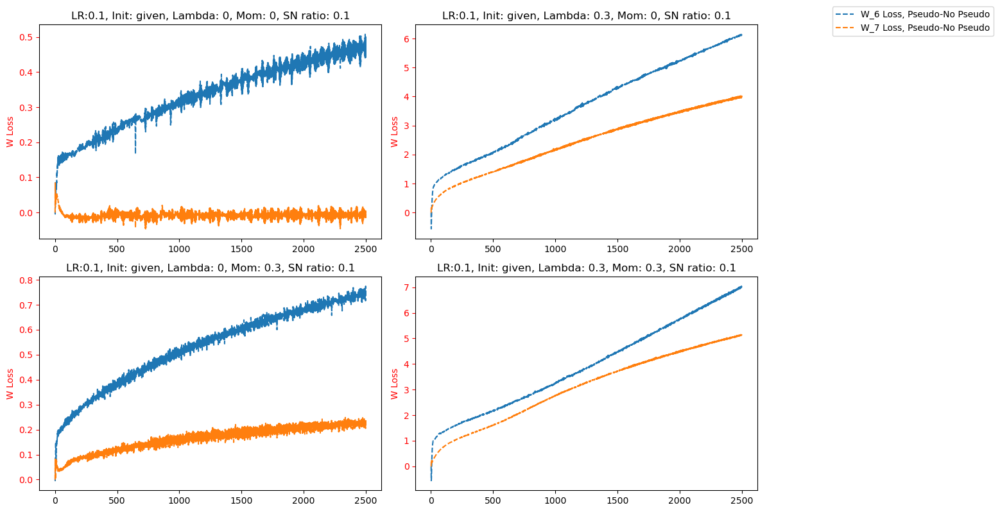

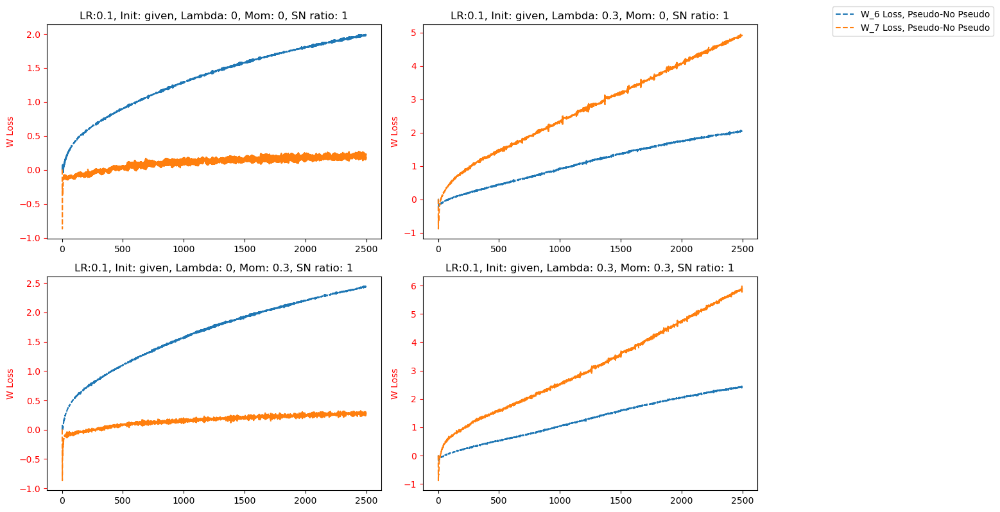

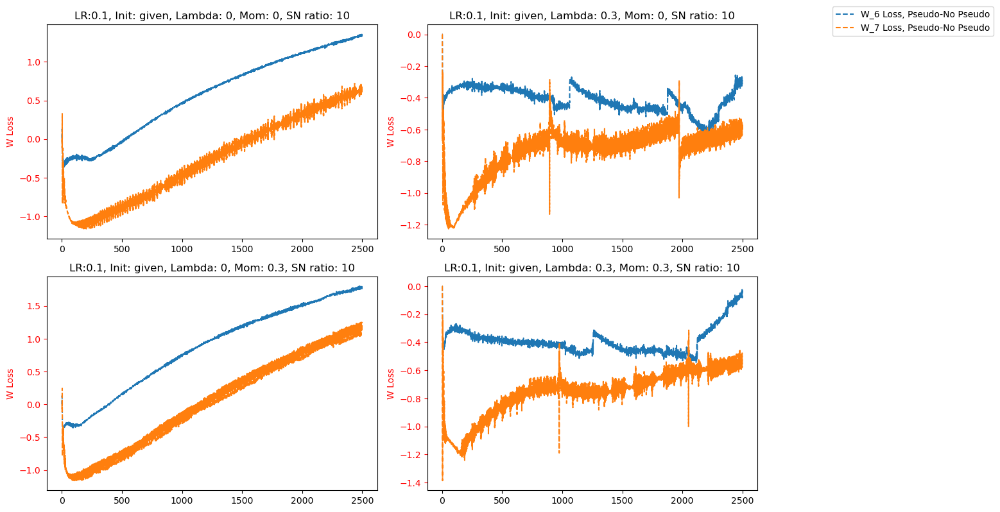

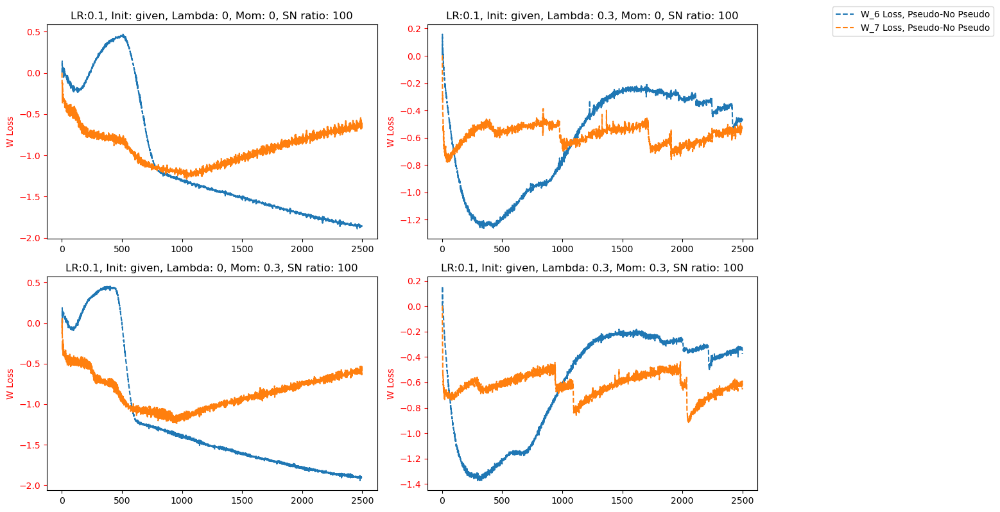

In [342]:
loss_datas = [l_data_pseudo, l_data_no_pseudo] 
w_loss_datas = [w_l_data_pseudo, w_l_data_no_pseudo]
inits = ['given']
w_true = [w_t_pseudo, w_t_pseudo]
w_of_int = [6,7]
lrs= [0.1]

N = epochs
x = range(epochs-N, epochs)


for llr, lr in enumerate(lrs):
    for l, ll in enumerate(inits):
        for m, mm in enumerate(stn_ratios):            
            fig, axs = plt.subplots(len(moms), len(lambdas), figsize=(12, 8))
            #print(f' True coefficients : {w_true[2:4]}, loss 2stlq: {w_2stg}')
            #print(f' True coefficients : {w_true[w_of_int]}')

            # Create a list to store legend handles and labels
            legend_handles, legend_labels = [], []
            lines = []

            for i in range(len(moms)):
                for j in range(len(lambdas)):

                    
                    # Plot on the current subplot
                    ax1 = axs[i, j]                    
                    w_t = w_true[0]
                    for k in w_of_int:
                        ww = torch.Tensor(epochs)
                        for e in range(epochs):
                            ww[e] = ((w_loss_datas[0][:,llr, m, l, k, i, j, e]/w_t[:, llr, m,  l, k]).abs()-(w_loss_datas[1][:,llr, m, l, k, i, j, e]/w_t[:, llr, m,  l, k]).abs()).mean()

                        line2, = ax1.plot(x, ww.detach().numpy(), linestyle='--', label=f'W_{k} Loss,  Pseudo-No Pseudo')
                        lines.append(line2)
                    ax1.set_ylabel('W Loss', color='r')
                    ax1.tick_params('y', colors='r')



                    ax1.set_title(f'LR:{lr}, Init: {ll}, Lambda: {lambdas[j]}, Mom: {moms[i]}, SN ratio: {mm}')
                    #print(f'Lambda: {lambdas[j]}, Mom: {moms[i]}, Loss at minimum : {(w_loss_data[w_of_int,i,j,loss_data[i, j, :].argmin()]/w_true[k]).abs()}')

            # Create a common legend outside the subplots
            # Extend the legend handles and labels

            legend_handles.extend(lines)
            legend_labels.extend([f'W_{k} Loss, Pseudo-No Pseudo' for k in w_of_int])
            fig.legend(legend_handles, legend_labels, bbox_to_anchor=(0.8, 0.5, 0.5, 0.5))


            # Adjust layout and display the plots
            plt.tight_layout()
            plt.show()

# Initialization

In [343]:
w_inits = ['cti','given', 'random', 'cov_guess']
dis = 'Laplace'
s_var = False 
lambdas = [0, 0.3]
moms = [0, 0.3]
epochs = 2500
n = 1000
reps = 10
lrs= [0.1]

v_min = 0.2
v_max = 5

w_max = 5
stn_ratios = [0.1, 1, 10, 100]

lr = 0.1

l_data_init = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(moms),len(lambdas),epochs)
w_l_data_init = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(un_g.edges()),len(moms),len(lambdas),epochs)

w_t_init = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(un_g.edges()))

In [344]:
for r in range(reps):
    for l, stn_ratio in enumerate(stn_ratios):
        varr, w_true, B_true = par_gen(latent = latent,observed = observed, g= un_g, g_adj = un_iv_adj,  same_var = s_var, v_min = v_min,
                                               v_max = v_max, w_max = w_max, stn_ratio = stn_ratio)
        data = hid_var_data(latent, observed, un_g ,n, B_true, distr = dis, varr = varr)
        for i, w_init in enumerate(w_inits):
            for j, lr in enumerate(lrs):
                w_t_init[r, j, l, i, :] = w_true

                l_data_init[r, j, l, i, :, :, :], w_l_data_init[r,j, l, i,  : ,:, :, :] = graphical_rica(withening = True, pseudoinv = False, latent = latent, observed = observed, g = un_g, data = data, moms = moms, lambdas = lambdas, epochs = epochs, lr = lr, w_init = w_init, w_true = w_true, cti_sd = 1)            

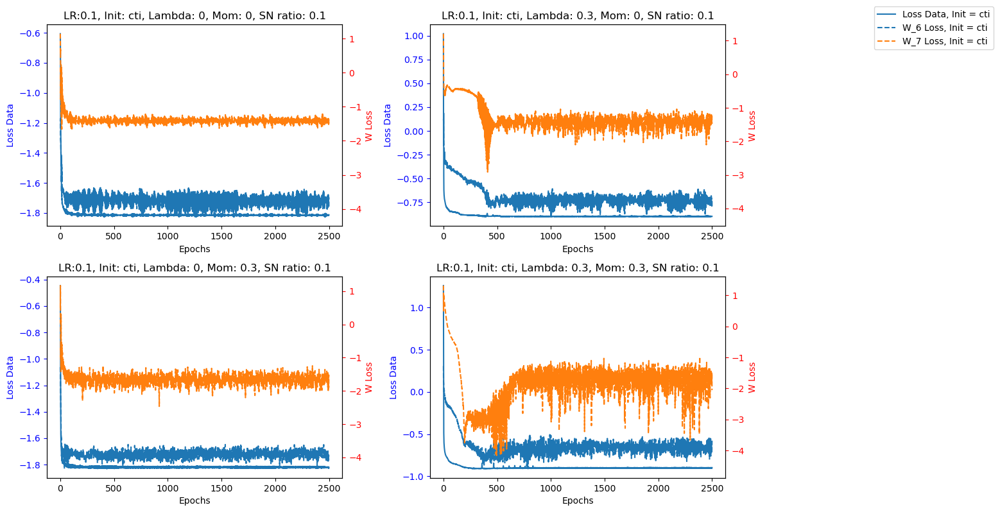

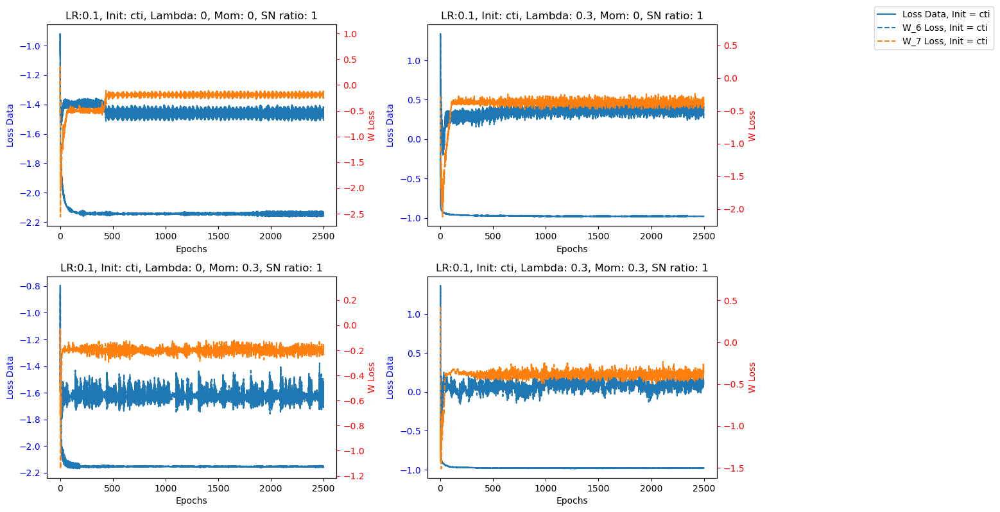

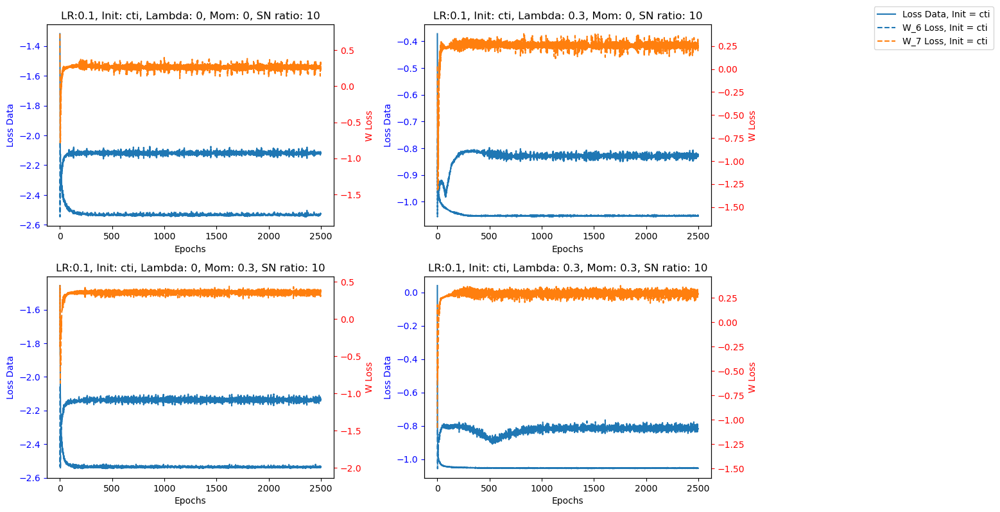

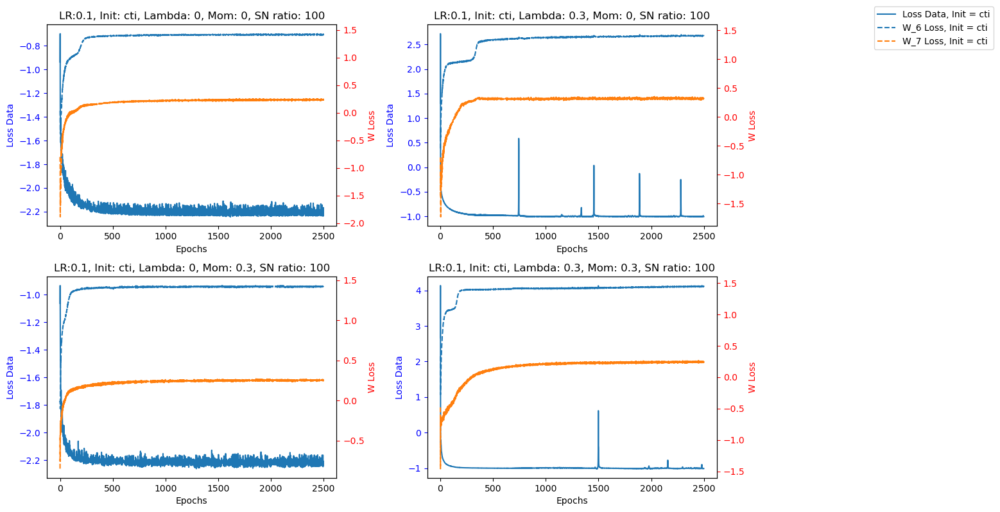

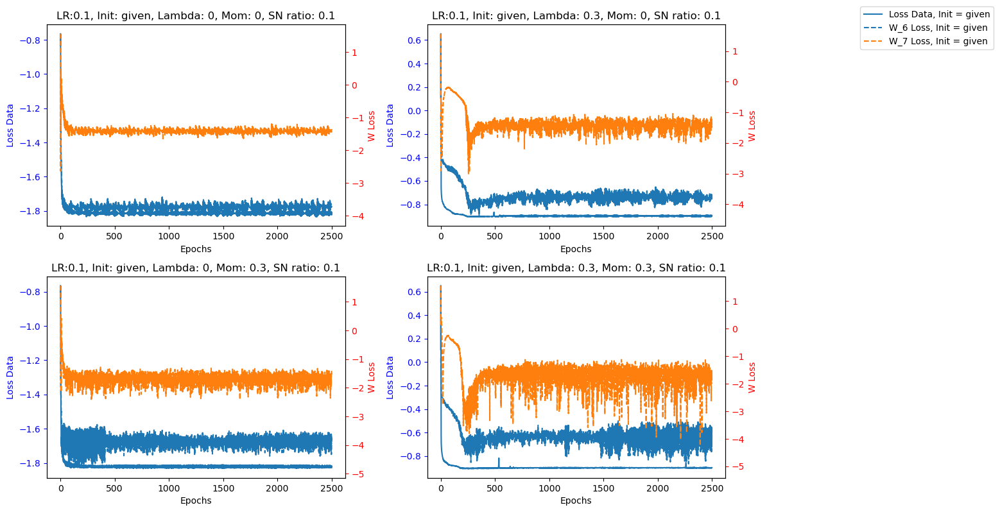

...

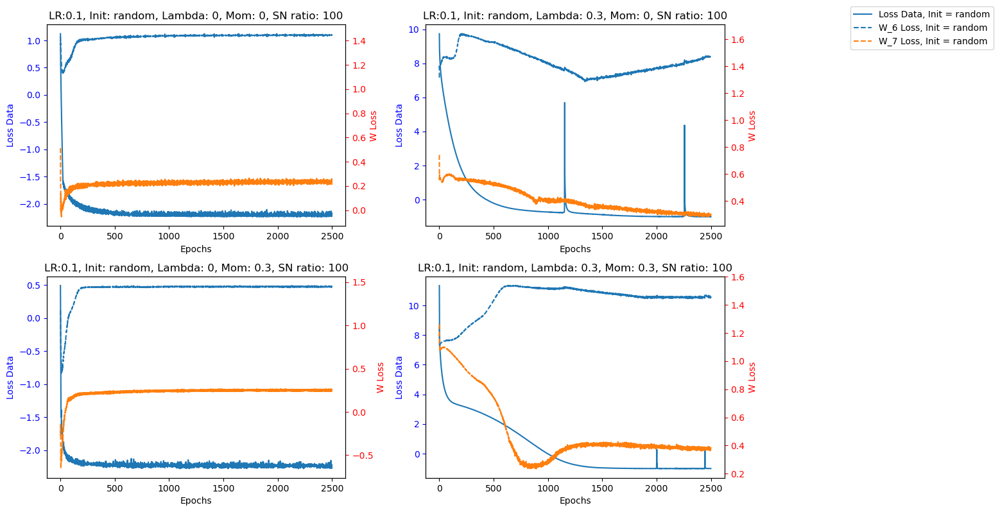

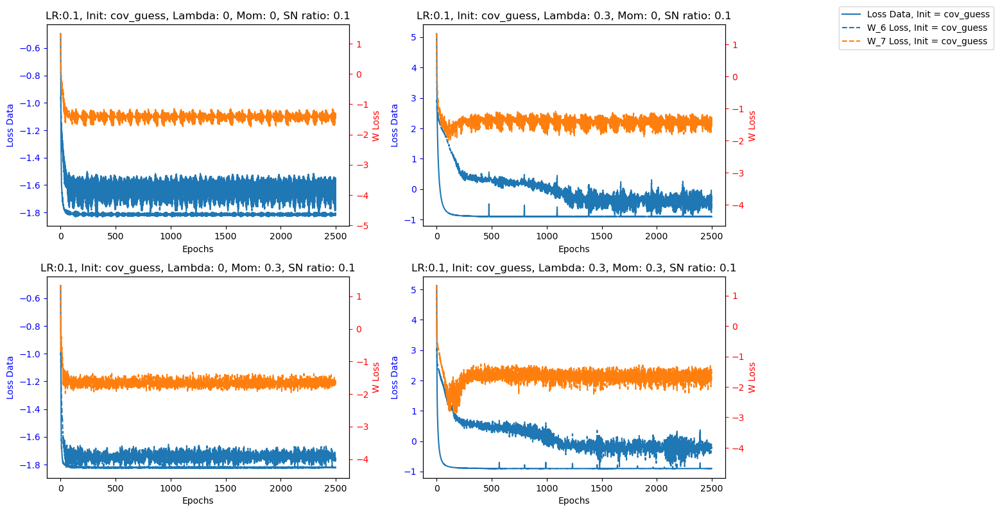

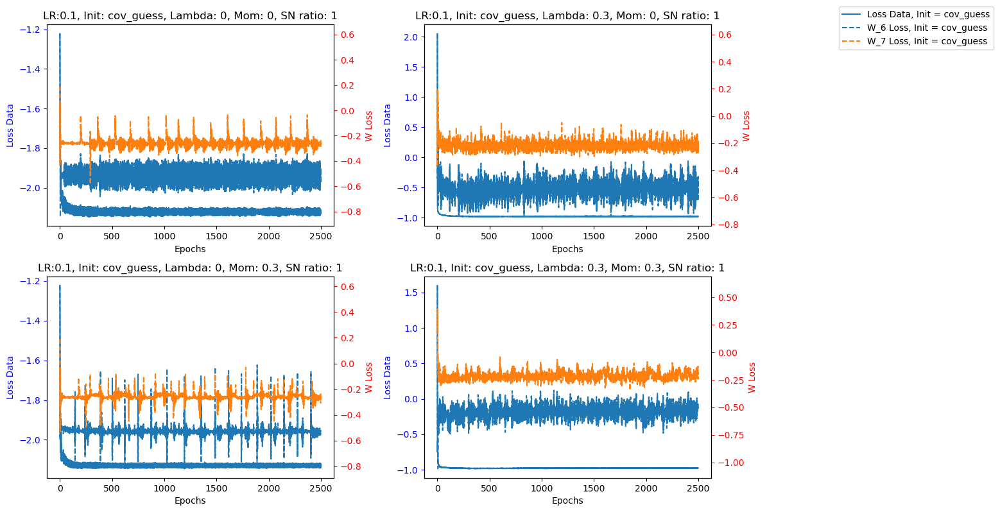

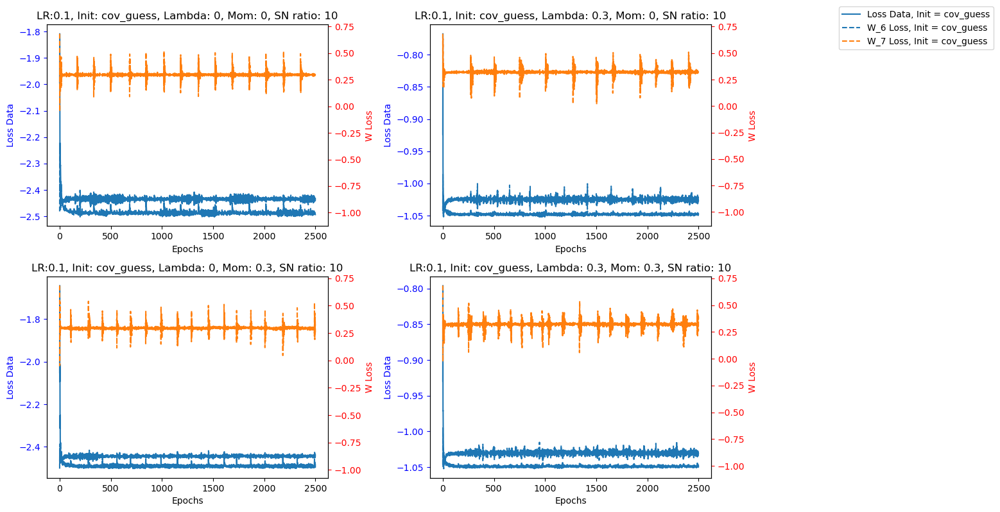

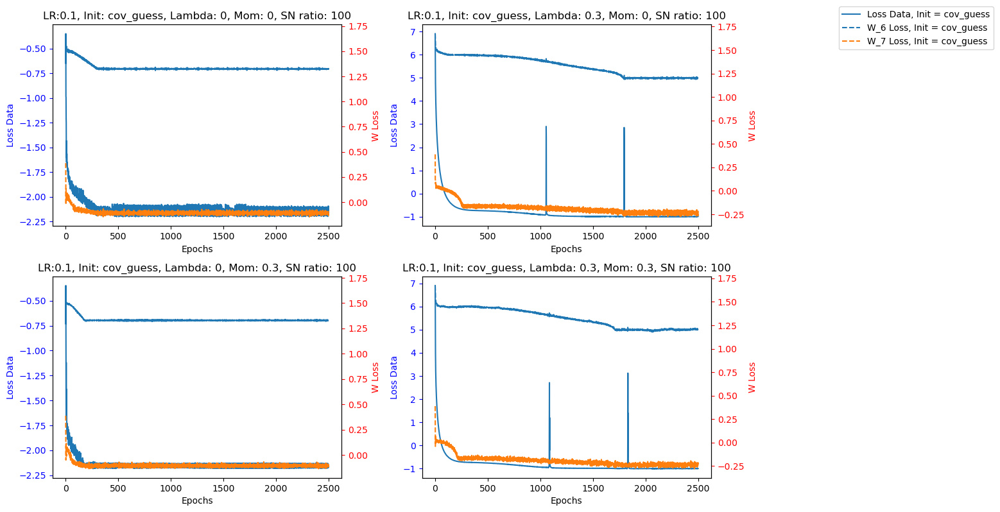

In [345]:
loss_datas = [l_data_init] 
w_loss_datas = [w_l_data_init]
w_true = [w_t_init, w_t_init]
w_of_int = [6,7]
lrs= [0.1]


N = epochs

x = range(epochs-N, epochs)

for llr, lr in enumerate(lrs):
    for l, ll in enumerate(w_inits):
        for m, mm in enumerate(stn_ratios):            
            fig, axs = plt.subplots(len(moms), len(lambdas), figsize=(12, 8))
            #print(f' True coefficients : {w_true[2:4]}, loss 2stlq: {w_2stg}')
            #print(f' True coefficients : {w_true[w_of_int]}')

            # Create a list to store legend handles and labels
            legend_handles, legend_labels = [], []
            lines = []

            for i in range(len(moms)):
                for j in range(len(lambdas)):

                    
                    # Plot on the current subplot
                    ax1 = axs[i, j]
                    for l_enum, loss_data in enumerate(loss_datas):
                        line1, = ax1.plot(x, loss_data[:, llr, m, l, i, j, :].mean(0).log().detach().numpy(), '-', label=f'Loss Data, Init = {ll}')
                        lines.append(line1)
                    ax1.set_xlabel('Epochs')
                    ax1.set_ylabel('Loss Data', color='b')
                    ax1.tick_params('y', colors='b')
                    
                    # Create a second y-axis on the same subplot
                    ax2 = ax1.twinx()
                    
                    for w_l_enum, w_loss_data in enumerate(w_loss_datas):
                        w_t = w_true[w_l_enum]
                        for k in w_of_int:
                            ww = torch.Tensor(epochs)
                            for e in range(epochs):
                                ww[e] = (w_loss_data[:,llr, m, l, k, i, j, e]/w_t[:, llr, m,  l, k]).abs().mean()
                            
                            line2, = ax2.plot(x, ww.log().detach().numpy(), linestyle='--', label=f'W_{k} Loss, Init = {ll} ')
                            lines.append(line2)
                    ax2.set_ylabel('W Loss', color='r')
                    ax2.tick_params('y', colors='r')



                    ax1.set_title(f'LR:{lr}, Init: {ll}, Lambda: {lambdas[j]}, Mom: {moms[i]}, SN ratio: {mm}')
                    #print(f'Lambda: {lambdas[j]}, Mom: {moms[i]}, Loss at minimum : {(w_loss_data[w_of_int,i,j,loss_data[i, j, :].argmin()]/w_true[k]).abs()}')

            # Create a common legend outside the subplots
            # Extend the legend handles and labels

            legend_handles.extend(lines)
            legend_labels.extend([f'Loss Data, Init = {ll}'] + [f'W_{k} Loss, Init = {ll}' for k in w_of_int])
            fig.legend(legend_handles, legend_labels, bbox_to_anchor=(0.8, 0.5, 0.5, 0.5))


            # Adjust layout and display the plots
            plt.tight_layout()
            plt.show()

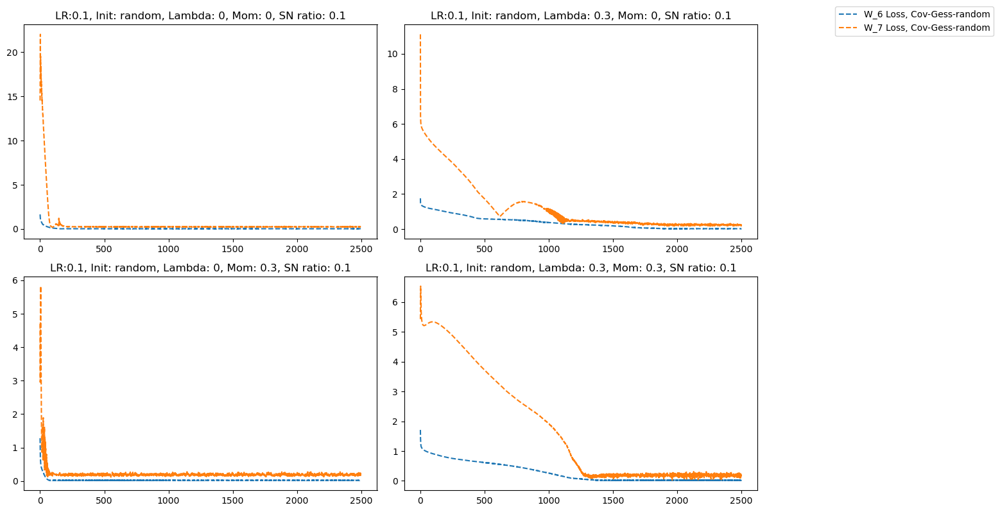

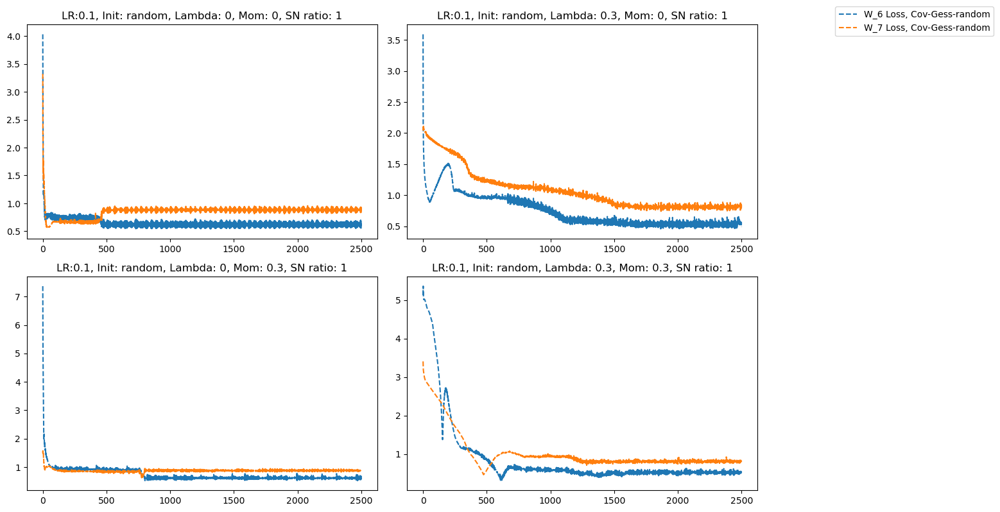

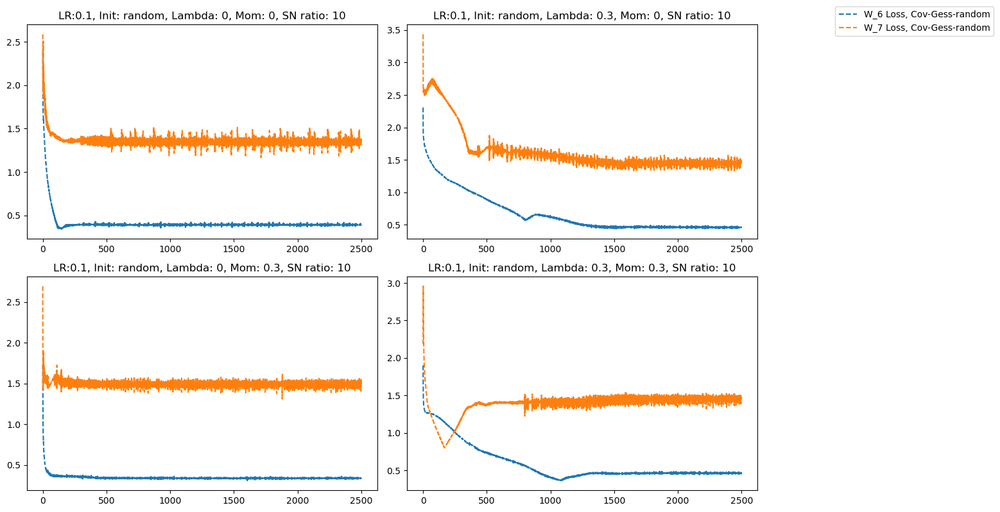

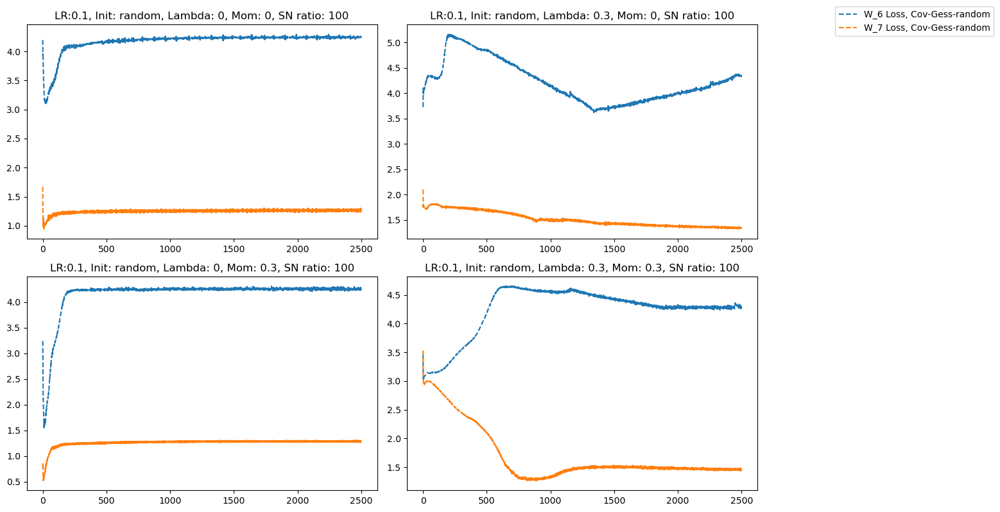

In [346]:
loss_datas = [l_data_init] 
w_loss_datas = [w_l_data_init]
w_true = [w_t_init, w_t_init]
w_of_int = [6,7]
lrs= [0.1]


N = epochs

x = range(epochs-N, epochs)

for llr, lr in enumerate(lrs):
    for l, ll in enumerate(['random']):
        for m, mm in enumerate(stn_ratios):            
            fig, axs = plt.subplots(len(moms), len(lambdas), figsize=(12, 8))
            #print(f' True coefficients : {w_true[2:4]}, loss 2stlq: {w_2stg}')
            #print(f' True coefficients : {w_true[w_of_int]}')

            # Create a list to store legend handles and labels
            legend_handles, legend_labels = [], []
            lines = []

            for i in range(len(moms)):
                for j in range(len(lambdas)):

                    
                    # Plot on the current subplot
                    ax1 = axs[i, j]                    
                    for w_l_enum, w_loss_data in enumerate(w_loss_datas):
                        w_t = w_true[w_l_enum]
                        for k in w_of_int:
                            ww = torch.Tensor(epochs)
                            ww_0 = torch.Tensor(epochs)
                            ww_p = torch.Tensor(epochs)
                            for e in range(epochs):
                                ww_0[e] = (w_loss_data[:,llr, m, 3, k, i, j, e]/w_t[:, llr, m,  3, k]).abs().mean()
                                ww[e] = (w_loss_data[:,llr, m, 2, k, i, j, e]/w_t[:, llr, m,  2, k]).abs().mean()
                                
                                ww_p[e] = ww_0[e] - ww[e]
                            line2, = ax1.plot(x, ww.detach().numpy(), linestyle='--', label=f'W_{k} Loss, Cov Guess-{ll} ')
                            lines.append(line2)
                    ax2.set_ylabel('W Loss', color='r')
                    ax2.tick_params('y', colors='r')



                    ax1.set_title(f'LR:{lr}, Init: {ll}, Lambda: {lambdas[j]}, Mom: {moms[i]}, SN ratio: {mm}')
                    #print(f'Lambda: {lambdas[j]}, Mom: {moms[i]}, Loss at minimum : {(w_loss_data[w_of_int,i,j,loss_data[i, j, :].argmin()]/w_true[k]).abs()}')

            # Create a common legend outside the subplots
            # Extend the legend handles and labels

            legend_handles.extend(lines)
            legend_labels.extend([f'W_{k} Loss, Cov-Gess-{ll}' for k in w_of_int])
            fig.legend(legend_handles, legend_labels, bbox_to_anchor=(0.8, 0.5, 0.5, 0.5))


            # Adjust layout and display the plots
            plt.tight_layout()
            plt.show()

# Same Variance

In [189]:
w_inits = ['given']
dis = 'Laplace'
s_vars = [True, False]
lambdas = [0, 0.3]
moms = [0, 0.3]
epochs = 2500
n = 1000
reps = 10
lrs= [0.1]


v_min = 0.2
v_max = 5

w_max = 5
stn_ratios = [0.1, 1, 10, 100]

lr = 0.1

l_data_samevar = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(moms),len(lambdas),epochs)
w_l_data_samevar = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(un_g.edges()),len(moms),len(lambdas),epochs)


l_data_no_samevar = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(moms),len(lambdas),epochs)
w_l_data_no_samevar = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(un_g.edges()),len(moms),len(lambdas),epochs)


w_t_samevar = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(un_g.edges()))

In [191]:
for r in range(reps):
    for l, stn_ratio in enumerate(stn_ratios):
        w_true, B_true = par_gen_weights(latent=latent,observed=observed,g = un_g, w_max = w_max)
        
        
        for s, s_var in enumerate(s_vars):
            varr =  par_gen_var(latent=latent,observed=observed,g = g, g_adj = g_adj, same_var = same_var, v_min = v_min, v_max = v_max, stn_ratio = stn_ratio)
            data = hid_var_data(latent, observed, un_g ,n, B_true, distr = dis, varr = varr)
            for i, w_init in enumerate(w_inits):
                for j, lr in enumerate(lrs):
                    w_t_samevar[r, j, l, i, :] = w_true
                    
                    if s == 0:
                        l_data_samevar[r, j, l, i, :, :, :], w_l_data_samevar[r,j, l, i,  : ,:, :, :] = graphical_rica(withening = True, pseudoinv = False, latent = latent, 
                                                                                                                   observed = observed, g = un_g, data = data, moms = moms, 
                                                                                                                   lambdas = lambdas, epochs = epochs, lr = lr,
                                                                                                                   w_init = w_init, w_true = w_true, cti_sd = 1) 
                    if s == 1:
                        l_data_no_samevar[r,j, l, i, :, :, :], w_l_data_no_samevar[r,j, l, i, : ,:, :, :] = graphical_rica(withening = True, pseudoinv = False, latent = latent, 
                                                                                                                      observed = observed, g = un_g, data = data, moms = moms, 
                                                                                                                      lambdas = lambdas, epochs = epochs, lr = lr,
                                                                                                                      w_init = w_init, w_true = w_true, cti_sd = 1) 

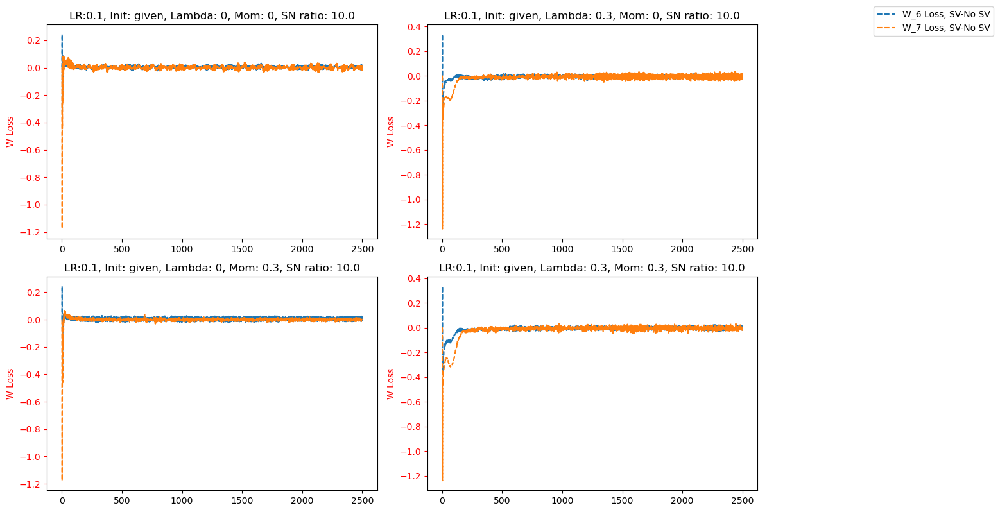

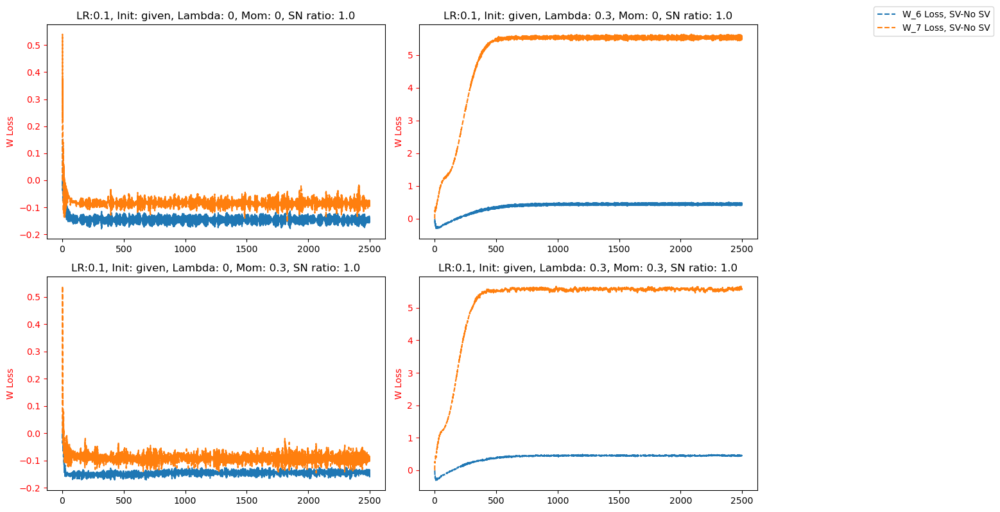

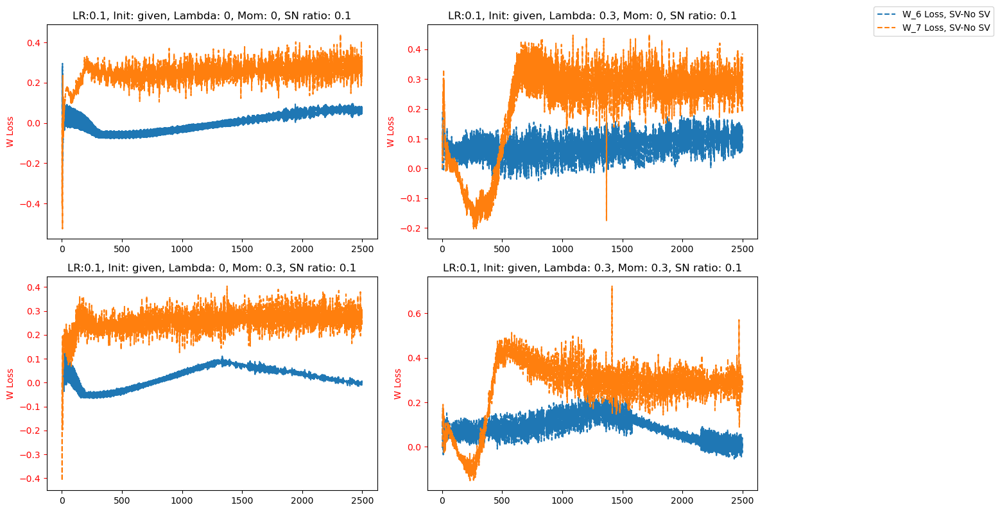

In [194]:
loss_datas = [l_data_samevar, l_data_no_samevar] 
w_loss_datas = [w_l_data_samevar, w_l_data_no_samevar]
inits = ['given']
w_true = [w_t_samevar, w_t_samevar]
w_of_int = [6,7]
lrs= [0.1]

N = epochs
x = range(epochs-N, epochs)


for llr, lr in enumerate(lrs):
    for l, ll in enumerate(inits):
        for m, mm in enumerate(stn_ratios):            
            fig, axs = plt.subplots(len(moms), len(lambdas), figsize=(12, 8))
            #print(f' True coefficients : {w_true[2:4]}, loss 2stlq: {w_2stg}')
            #print(f' True coefficients : {w_true[w_of_int]}')

            # Create a list to store legend handles and labels
            legend_handles, legend_labels = [], []
            lines = []

            for i in range(len(moms)):
                for j in range(len(lambdas)):

                    
                    # Plot on the current subplot
                    ax1 = axs[i, j]                    
                    w_t = w_true[0]
                    for k in w_of_int:
                        ww = torch.Tensor(epochs)
                        for e in range(epochs):
                            ww[e] = ((w_loss_datas[0][:,llr, m, l, k, i, j, e]/w_t[:, llr, m,  l, k]).abs()-(w_loss_datas[1][:,llr, m, l, k, i, j, e]/w_t[:, llr, m,  l, k]).abs()).mean()

                        line2, = ax1.plot(x, ww.detach().numpy(), linestyle='--', label=f'W_{k} Loss,  SV-No SV')
                        lines.append(line2)
                    ax1.set_ylabel('W Loss', color='r')
                    ax1.tick_params('y', colors='r')



                    ax1.set_title(f'LR:{lr}, Init: {ll}, Lambda: {lambdas[j]}, Mom: {moms[i]}, SN ratio: {mm}')
                    #print(f'Lambda: {lambdas[j]}, Mom: {moms[i]}, Loss at minimum : {(w_loss_data[w_of_int,i,j,loss_data[i, j, :].argmin()]/w_true[k]).abs()}')

            # Create a common legend outside the subplots
            # Extend the legend handles and labels

            legend_handles.extend(lines)
            legend_labels.extend([f'W_{k} Loss, SV-No SV' for k in w_of_int])
            fig.legend(legend_handles, legend_labels, bbox_to_anchor=(0.8, 0.5, 0.5, 0.5))


            # Adjust layout and display the plots
            plt.tight_layout()
            plt.show()

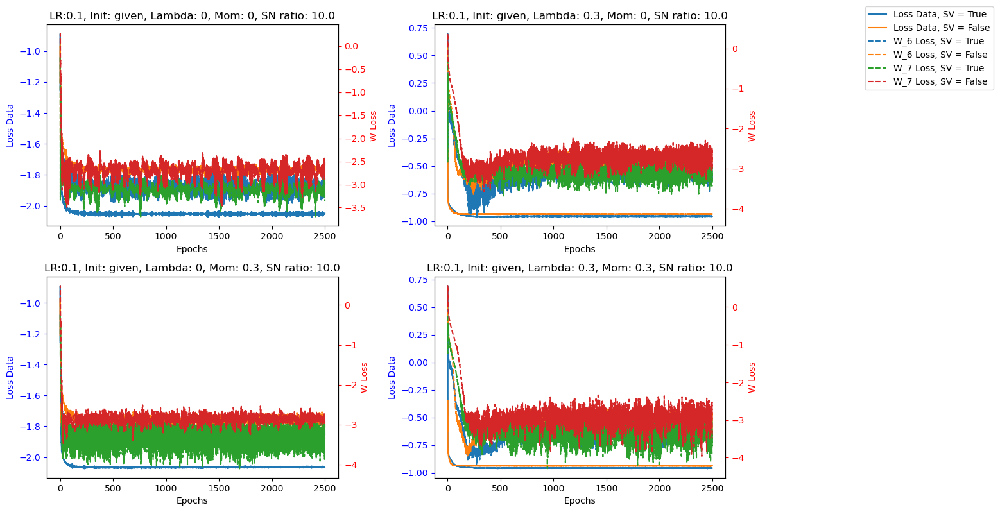

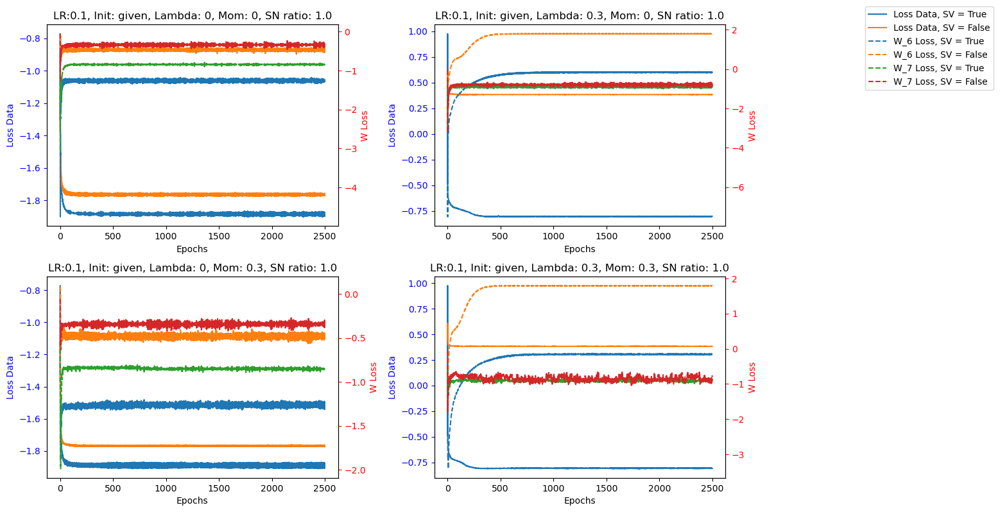

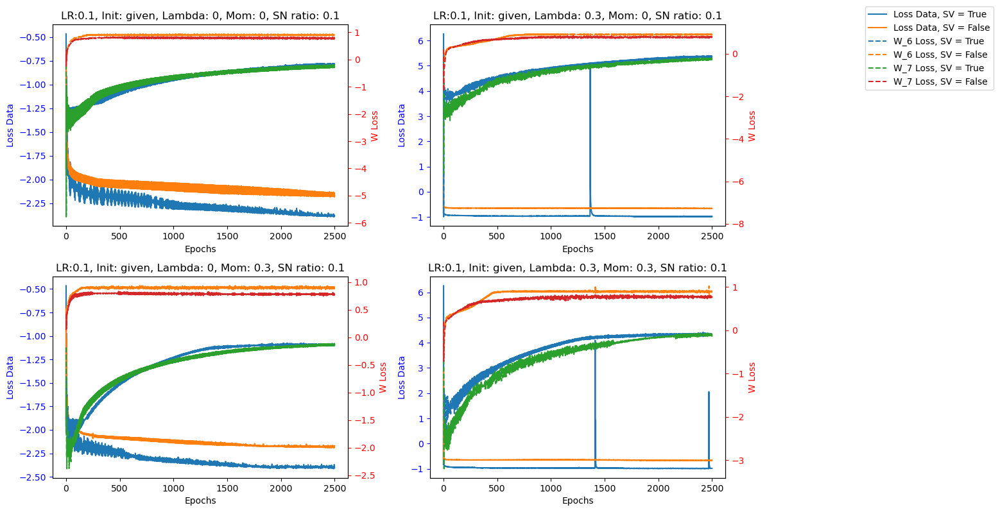

In [193]:
loss_datas = [l_data_samevar, l_data_no_samevar] 
w_loss_datas = [w_l_data_samevar, w_l_data_no_samevar]
inits = ['given']
w_true = [w_t_samevar, w_t_samevar]
w_of_int = [6,7]
lrs= [0.1]

N = epochs
x = range(epochs-N, epochs)

dic = [True, False]
for llr, lr in enumerate(lrs):
    for l, ll in enumerate(w_inits):
        for m, mm in enumerate(stn_ratios):            
            fig, axs = plt.subplots(len(moms), len(lambdas), figsize=(12, 8))
            #print(f' True coefficients : {w_true[2:4]}, loss 2stlq: {w_2stg}')
            #print(f' True coefficients : {w_true[w_of_int]}')

            # Create a list to store legend handles and labels
            legend_handles, legend_labels = [], []
            lines = []

            for i in range(len(moms)):
                for j in range(len(lambdas)):

                    
                    # Plot on the current subplot
                    ax1 = axs[i, j]
                    for l_enum, loss_data in enumerate(loss_datas):
                        line1, = ax1.plot(x, loss_data[:, llr, m, l, i, j, :].mean(0).log().detach().numpy(), '-', label=f'Loss Data, SV = {dic[l_enum]}')
                        lines.append(line1)
                    ax1.set_xlabel('Epochs')
                    ax1.set_ylabel('Loss Data', color='b')
                    ax1.tick_params('y', colors='b')
                    
                    # Create a second y-axis on the same subplot
                    ax2 = ax1.twinx()
                    
                    for w_l_enum, w_loss_data in enumerate(w_loss_datas):
                        w_t = w_true[w_l_enum]
                        for k in w_of_int:
                            ww = torch.Tensor(epochs)
                            for e in range(epochs):
                                ww[e] = (w_loss_data[:,llr, m, l, k, i, j, e]/w_t[:, llr, m,  l, k]).abs().mean()
                            
                            line2, = ax2.plot(x, ww.log().detach().numpy(), linestyle='--', label=f'W_{k} Loss, SV = {dic[w_l_enum]} ')
                            lines.append(line2)
                    ax2.set_ylabel('W Loss', color='r')
                    ax2.tick_params('y', colors='r')



                    ax1.set_title(f'LR:{lr}, Init: {ll}, Lambda: {lambdas[j]}, Mom: {moms[i]}, SN ratio: {mm}')
                    #print(f'Lambda: {lambdas[j]}, Mom: {moms[i]}, Loss at minimum : {(w_loss_data[w_of_int,i,j,loss_data[i, j, :].argmin()]/w_true[k]).abs()}')

            # Create a common legend outside the subplots
            # Extend the legend handles and labels

            legend_handles.extend(lines)
            legend_labels.extend([f'Loss Data, SV = {sv_enum}' for sv_enum in dic] + [f'W_{k} Loss, SV = {sv_enum}' for k in w_of_int for sv_enum in dic])
            fig.legend(legend_handles, legend_labels, bbox_to_anchor=(0.8, 0.5, 0.5, 0.5))


            # Adjust layout and display the plots
            plt.tight_layout()
            plt.show()

# Distrubution

In [228]:
w_inits = ['random', 'given']
diss = ['Laplace', 'Normal', 'Cauchy']
s_vars = [False]
lambdas = [0, 0.3]
moms = [0, 0.3]
epochs = 2500
n = 1000
reps = 10
lrs= [0.1]

v_min = 0.2
v_max = 5

w_max = 5
stn_ratios = [0.1, 1, 10, 100]

lr = 0.1

l_data_lap = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(moms),len(lambdas),epochs)
w_l_data_lap = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(un_g.edges()),len(moms),len(lambdas),epochs)


l_data_nor = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(moms),len(lambdas),epochs)
w_l_data_nor = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(un_g.edges()),len(moms),len(lambdas),epochs)

l_data_cau = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(moms),len(lambdas),epochs)
w_l_data_cau = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(un_g.edges()),len(moms),len(lambdas),epochs)

w_t_distr = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(un_g.edges()))

In [229]:
for r in range(reps):
    for l, stn_ratio in enumerate(stn_ratios):
        w_true, B_true = par_gen_weights(latent = latent,observed = observed, g= un_g, w_max = w_max, stn_ratio = stn_ratio)
        varr =  par_gen_var(latent = latent,observed = observed, g= un_g, same_var = s_var, v_min = v_min, v_lat_min = v_lat_min,
                                               v_max = v_max, v_lat_max = v_lat_max)
        for s, dis in enumerate(diss):
            data = hid_var_data(latent, observed, un_g ,n, B_true, distr = dis, varr = varr)
            for i, w_init in enumerate(w_inits):
                for j, lr in enumerate(lrs):
                    w_t_distr[r, j, l, i, :] = w_true
                    
                    if s == 0:
                        l_data_lap[r, j, l, i, :, :, :], w_l_data_lap[r,j, l, i,  : ,:, :, :] = graphical_rica(withening = True, pseudoinv = False, latent = latent, 
                                                                                                                   observed = observed, g = un_g, data = data, moms = moms, 
                                                                                                                   lambdas = lambdas, epochs = epochs, lr = lr,
                                                                                                                   w_init = w_init, w_true = w_true, cti_sd = 1) 
                    if s == 1:
                        l_data_nor[r,j, l, i, :, :, :], w_l_data_nor[r,j, l, i, : ,:, :, :] = graphical_rica(withening = True, pseudoinv = False, latent = latent, 
                                                                                                                      observed = observed, g = un_g, data = data, moms = moms, 
                                                                                                                      lambdas = lambdas, epochs = epochs, lr = lr,
                                                                                                                      w_init = w_init, w_true = w_true, cti_sd = 1) 
                        
                    if s == 2:
                        l_data_cau[r,j, l, i, :, :, :], w_l_data_cau[r,j, l, i, : ,:, :, :] = graphical_rica(withening = True, pseudoinv = False, latent = latent, 
                                                                                                                      observed = observed, g = un_g, data = data, moms = moms, 
                                                                                                                      lambdas = lambdas, epochs = epochs, lr = lr,
                                                                                                                      w_init = w_init, w_true = w_true, cti_sd = 1) 

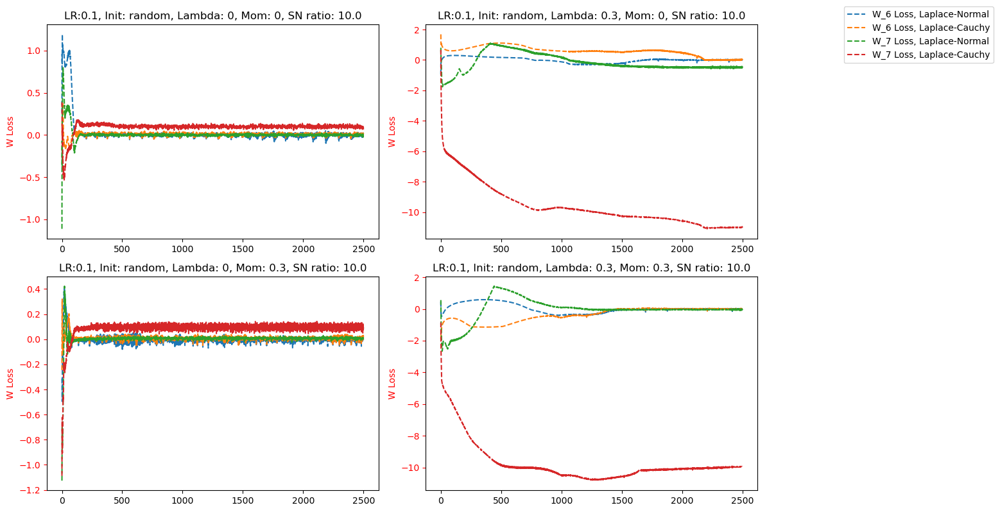

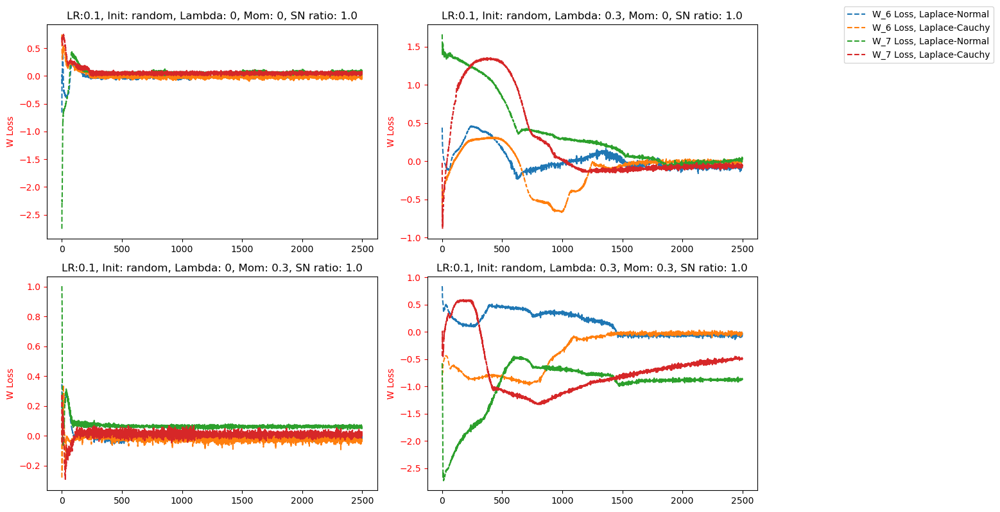

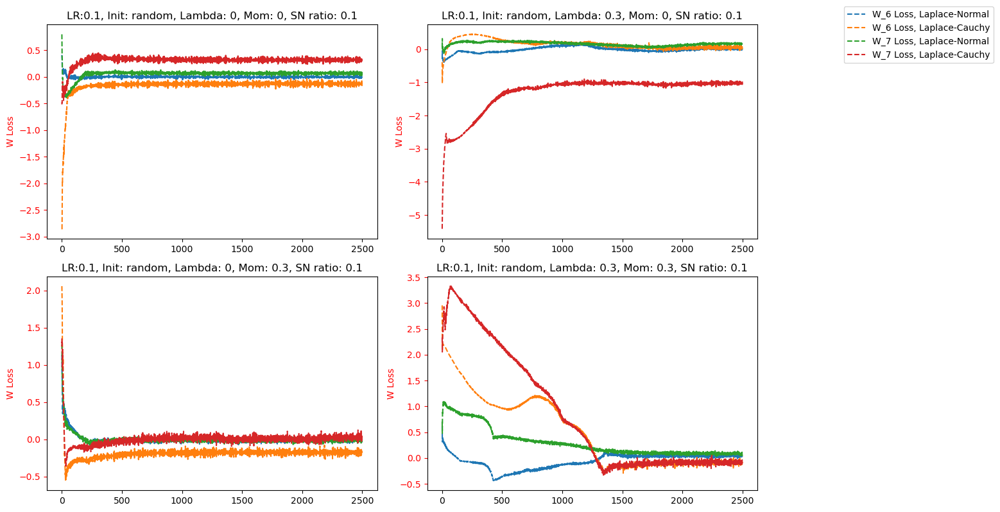

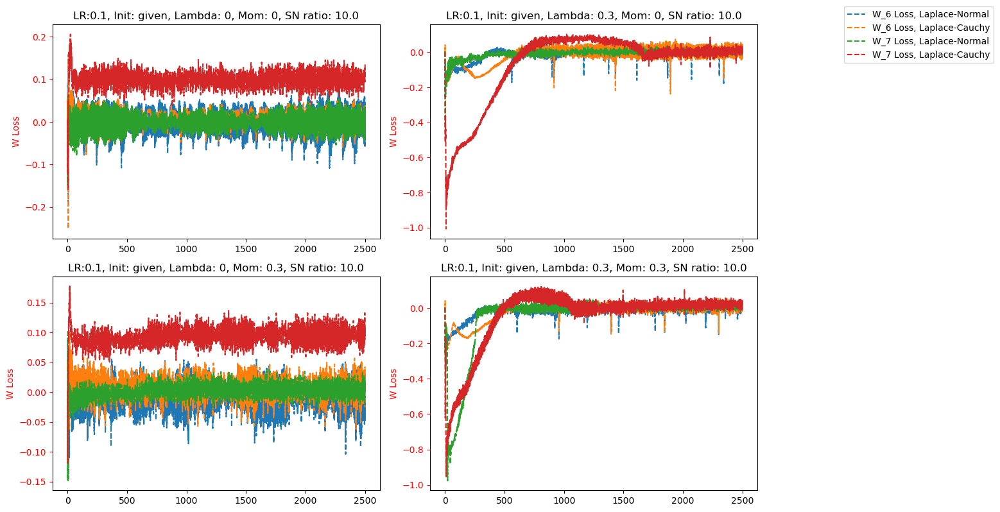

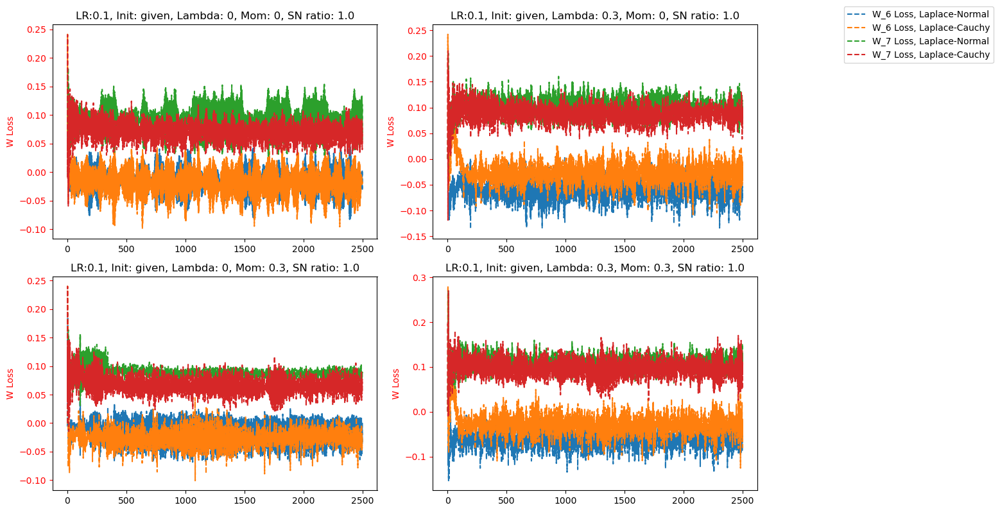

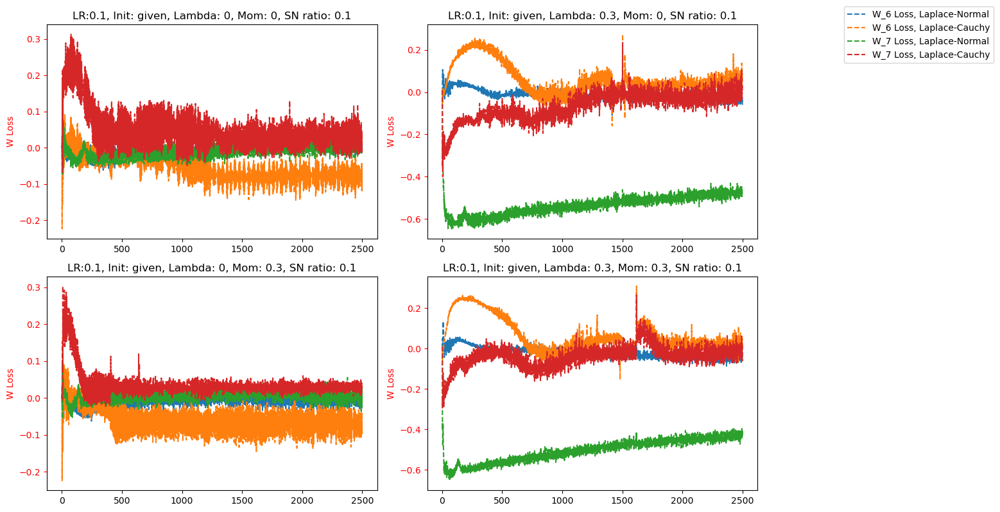

In [230]:
loss_datas = [l_data_lap, l_data_nor, l_data_cau] 
w_loss_datas = [w_l_data_lap, w_l_data_nor, w_l_data_cau]
inits = w_inits
w_true = [w_t_distr, w_t_distr, w_t_distr]
w_of_int = [6,7]
lrs= [0.1]

N = epochs
x = range(epochs-N, epochs)


for llr, lr in enumerate(lrs):
    for l, ll in enumerate(inits):
        for m, mm in enumerate(stn_ratios):            
            fig, axs = plt.subplots(len(moms), len(lambdas), figsize=(12, 8))
            #print(f' True coefficients : {w_true[2:4]}, loss 2stlq: {w_2stg}')
            #print(f' True coefficients : {w_true[w_of_int]}')

            # Create a list to store legend handles and labels
            legend_handles, legend_labels = [], []
            lines = []

            for i in range(len(moms)):
                for j in range(len(lambdas)):

                    
                    # Plot on the current subplot
                    ax1 = axs[i, j]                    
                    w_t = w_true[0]
                    for d_count in range(1,3):
                        for k in w_of_int:
                            ww = torch.Tensor(epochs)
                            for e in range(epochs):
                                ww[e] = ((w_loss_datas[0][:,llr, m, l, k, i, j, e]/w_t[:, llr, m,  l, k]).abs()-(w_loss_datas[d_count][:,llr, m, l, k, i, j, e]/w_t[:, llr, m,  l, k]).abs()).mean()

                            line2, = ax1.plot(x, ww.detach().numpy(), linestyle='--', label=f'W_{k} Loss, {diss[0]}-{diss[d_count]}')
                            lines.append(line2)
                        ax1.set_ylabel('W Loss', color='r')
                        ax1.tick_params('y', colors='r')



                    ax1.set_title(f'LR:{lr}, Init: {ll}, Lambda: {lambdas[j]}, Mom: {moms[i]}, SN ratio: {mm}')
                    #print(f'Lambda: {lambdas[j]}, Mom: {moms[i]}, Loss at minimum : {(w_loss_data[w_of_int,i,j,loss_data[i, j, :].argmin()]/w_true[k]).abs()}')

            # Create a common legend outside the subplots
            # Extend the legend handles and labels

            legend_handles.extend(lines)
            legend_labels.extend([f'W_{k} Loss, {diss[0]}-{diss[d_count]}' for k in w_of_int for d_count in range(1,3)])
            fig.legend(legend_handles, legend_labels, bbox_to_anchor=(0.8, 0.5, 0.5, 0.5))


            # Adjust layout and display the plots
            plt.tight_layout()
            plt.show()

# Sample size

In [203]:
w_inits = ['given', 'random']
dis = 'Laplace'
s_vars = [False]
lambdas = [0, 0.3]
moms = [0, 0.3]
epochs = 2500
ns = [10, 100, 1000, 10000]
n = 15000
reps = 10
lrs= [0.1]

v_min = 0.2
v_max = 5

w_max = 5
stn_ratios = [0.1, 1, 10, 100]

lr = 0.1

l_data_10 = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(moms),len(lambdas),epochs)
w_l_data_10 = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(un_g.edges()),len(moms),len(lambdas),epochs)

l_data_100 = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(moms),len(lambdas),epochs)
w_l_data_100 = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(un_g.edges()),len(moms),len(lambdas),epochs)

l_data_1000 = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(moms),len(lambdas),epochs)
w_l_data_1000 = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(un_g.edges()),len(moms),len(lambdas),epochs)

l_data_10000 = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(moms),len(lambdas),epochs)
w_l_data_10000 = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(un_g.edges()),len(moms),len(lambdas),epochs)

w_t_samples = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(un_g.edges()))

In [207]:
for r in range(reps):
    for l, stn_ratio in enumerate(stn_ratios):
        v_lat_max = stn_ratio
        varr, w_true, B_true = par_gen(latent = latent,observed = observed, g= un_g, g_adj = un_iv_adj,  same_var = s_var, v_min = v_min,
                                               v_max = v_max, w_max = w_max, stn_ratio = stn_ratio)
        data = hid_var_data(latent, observed, un_g ,n, B_true, distr = dis, varr = varr)
        
        data_complete = hid_var_data(latent, observed, un_g ,n, B_true, distr = dis, varr = varr)
        for s, nn in enumerate(ns):
            data = data_complete[range(nn), :]
            for i, w_init in enumerate(w_inits):
                for j, lr in enumerate(lrs):
                    w_t_samples[r, j, l, i, :] = w_true
                    
                    if s == 0:
                        l_data_10[r, j, l, i, :, :, :], w_l_data_10[r,j, l, i,  : ,:, :, :] = graphical_rica(withening = True, pseudoinv = False, latent = latent, 
                                                                                                                   observed = observed, g = un_g, data = data, moms = moms, 
                                                                                                                   lambdas = lambdas, epochs = epochs, lr = lr,
                                                                                                                   w_init = w_init, w_true = w_true, cti_sd = 1) 
                    if s == 1:
                        l_data_100[r,j, l, i, :, :, :], w_l_data_100[r,j, l, i, : ,:, :, :] = graphical_rica(withening = True, pseudoinv = False, latent = latent, 
                                                                                                                      observed = observed, g = un_g, data = data, moms = moms, 
                                                                                                                      lambdas = lambdas, epochs = epochs, lr = lr,
                                                                                                                      w_init = w_init, w_true = w_true, cti_sd = 1) 
                        
                    if s == 2:
                        l_data_1000[r,j, l, i, :, :, :], w_l_data_1000[r,j, l, i, : ,:, :, :] = graphical_rica(withening = True, pseudoinv = False, latent = latent, 
                                                                                                                      observed = observed, g = un_g, data = data, moms = moms, 
                                                                                                                      lambdas = lambdas, epochs = epochs, lr = lr,
                                                                                                                      w_init = w_init, w_true = w_true, cti_sd = 1) 
                    if s == 3:
                        l_data_1000[r,j, l, i, :, :, :], w_l_data_10000[r,j, l, i, : ,:, :, :] = graphical_rica(withening = True, pseudoinv = False, latent = latent, 
                                                                                                                      observed = observed, g = un_g, data = data, moms = moms, 
                                                                                                                      lambdas = lambdas, epochs = epochs, lr = lr,
                                                                                                                      w_init = w_init, w_true = w_true, cti_sd = 1) 

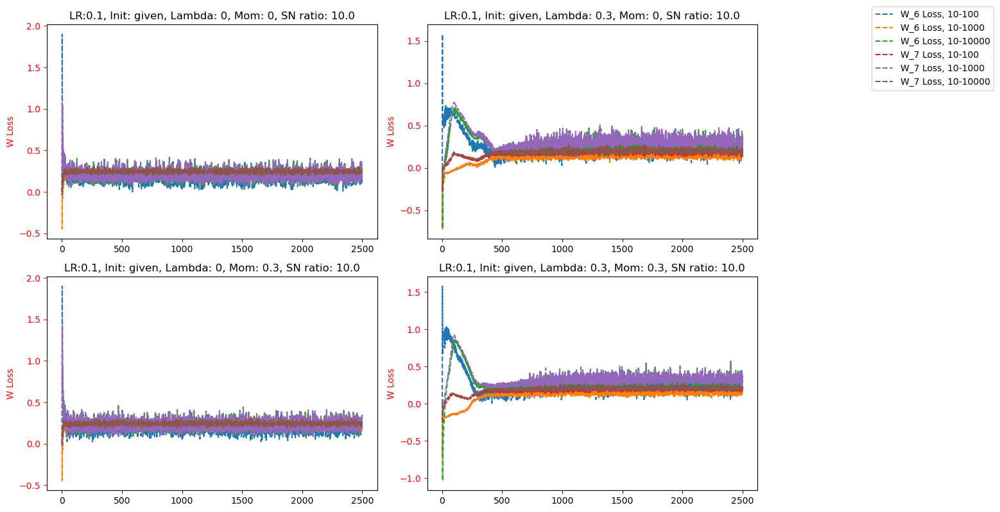

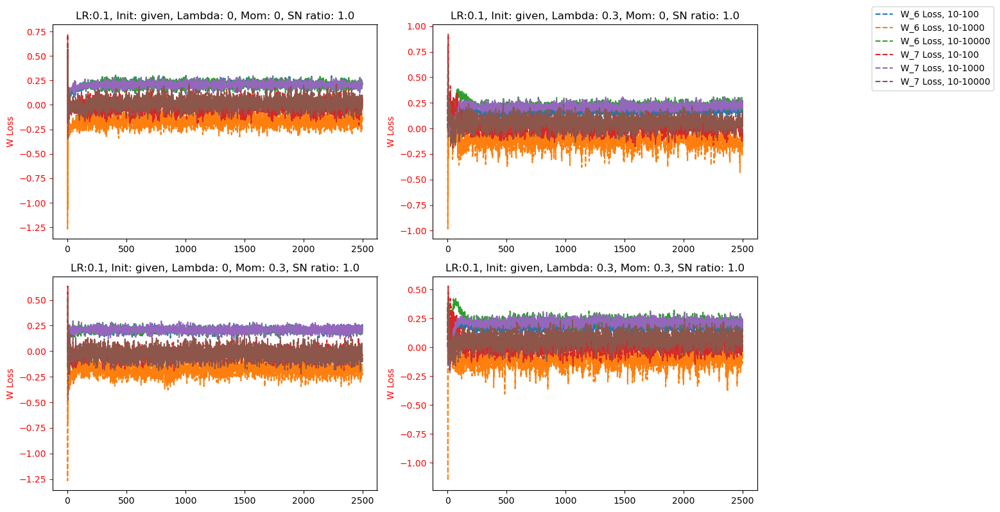

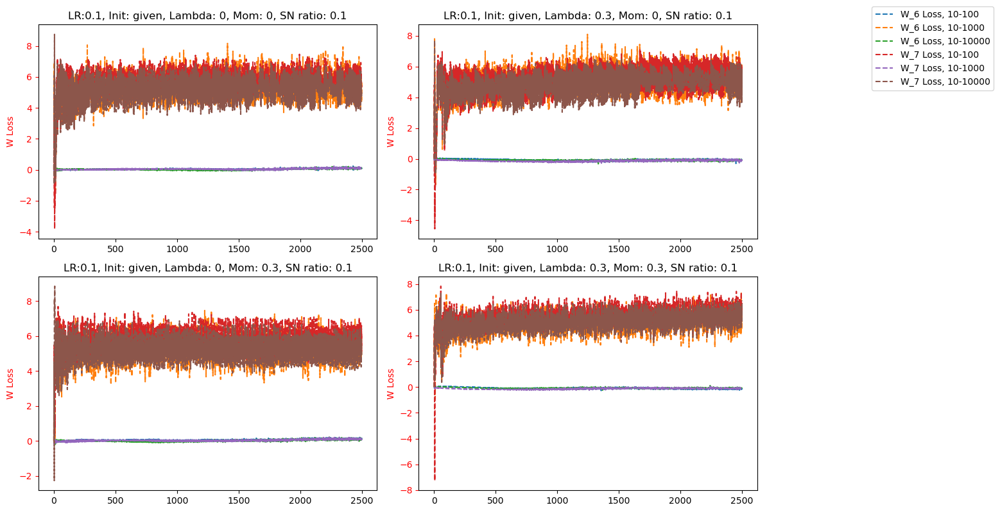

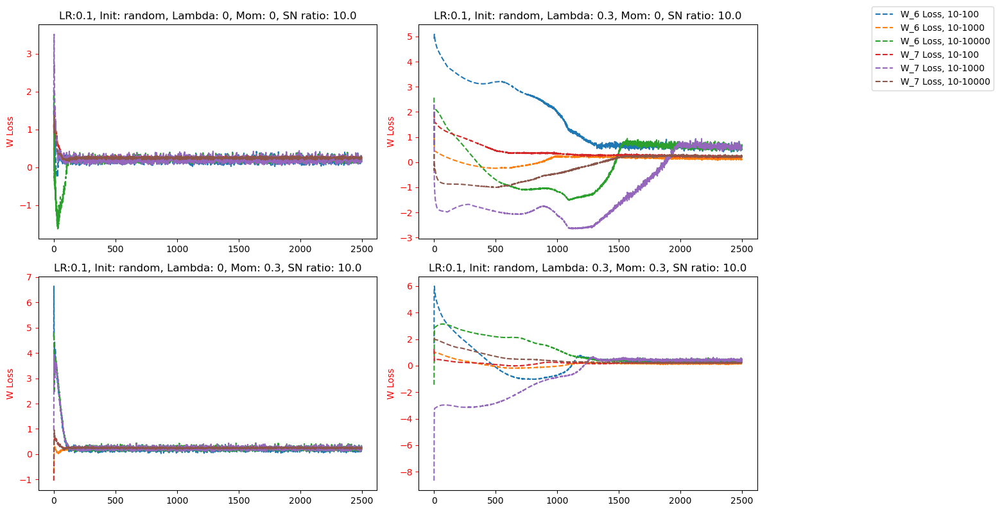

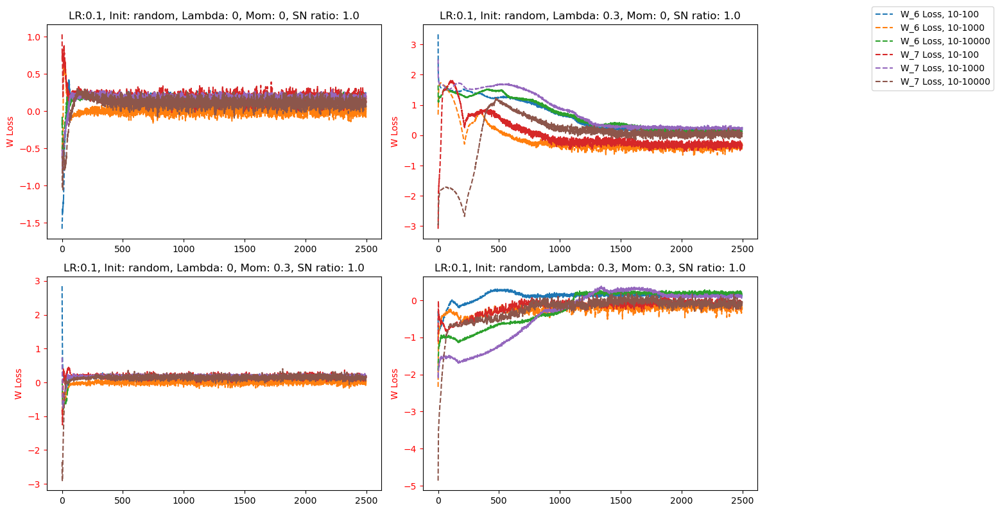

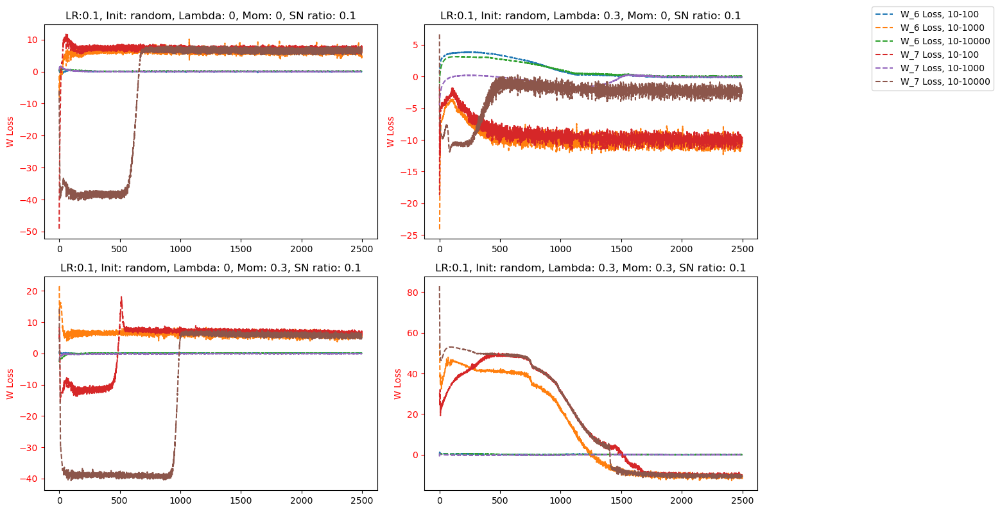

In [210]:
loss_datas = [l_data_10, l_data_100, l_data_1000, l_data_10000] 
w_loss_datas = [w_l_data_10, w_l_data_100, w_l_data_1000, w_l_data_10000]
inits = ['given', 'random']
w_true = [w_t_samples, w_t_samples, w_t_samples, w_t_samples]
w_of_int = [6,7]
lrs= [0.1]

N = epochs
x = range(epochs-N, epochs)


for llr, lr in enumerate(lrs):
    for l, ll in enumerate(inits):
        for m, mm in enumerate(stn_ratios):            
            fig, axs = plt.subplots(len(moms), len(lambdas), figsize=(12, 8))
            #print(f' True coefficients : {w_true[2:4]}, loss 2stlq: {w_2stg}')
            #print(f' True coefficients : {w_true[w_of_int]}')

            # Create a list to store legend handles and labels
            legend_handles, legend_labels = [], []
            lines = []

            for i in range(len(moms)):
                for j in range(len(lambdas)):

                    
                    # Plot on the current subplot
                    ax1 = axs[i, j]                    
                    w_t = w_true[0]
                    for d_count in range(1,4):
                        for k in w_of_int:
                            ww = torch.Tensor(epochs)
                            for e in range(epochs):
                                ww[e] = ((w_loss_datas[0][:,llr, m, l, k, i, j, e]/w_t[:, llr, m,  l, k]).abs()-(w_loss_datas[d_count][:,llr, m, l, k, i, j, e]/w_t[:, llr, m,  l, k]).abs()).mean()

                            line2, = ax1.plot(x, ww.detach().numpy(), linestyle='--', label=f'W_{k} Loss, {ns[0]}-{ns[d_count]}')
                            lines.append(line2)
                        ax1.set_ylabel('W Loss', color='r')
                        ax1.tick_params('y', colors='r')



                    ax1.set_title(f'LR:{lr}, Init: {ll}, Lambda: {lambdas[j]}, Mom: {moms[i]}, SN ratio: {mm}')
                    #print(f'Lambda: {lambdas[j]}, Mom: {moms[i]}, Loss at minimum : {(w_loss_data[w_of_int,i,j,loss_data[i, j, :].argmin()]/w_true[k]).abs()}')

            # Create a common legend outside the subplots
            # Extend the legend handles and labels

            legend_handles.extend(lines)
            legend_labels.extend([f'W_{k} Loss, {ns[0]}-{ns[d_count]}' for k in w_of_int for d_count in range(1,4)])
            fig.legend(legend_handles, legend_labels, bbox_to_anchor=(0.8, 0.5, 0.5, 0.5))


            # Adjust layout and display the plots
            plt.tight_layout()
            plt.show()

# DiD graph

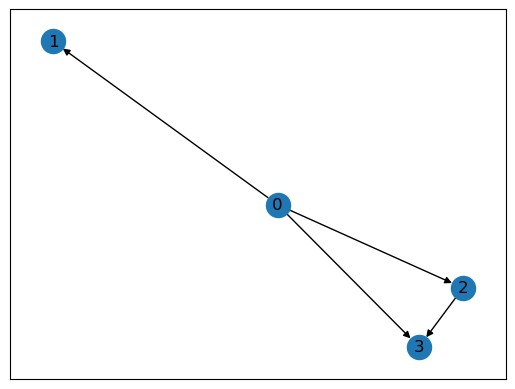

In [352]:
adj_did = np.array([[0,1,1,1],[0,0,0,0],[0,0,0,1],[0,0,0,0]])
g_did = nx.DiGraph(adj_did)
nx.draw_networkx(g_did)
latent = 1
observed = 3

In [353]:
w_inits = ['given', 'random']
diss = ['Laplace', 'Normal', 'Cauchy']
s_vars = [False]
lambdas = [0, 0.3]
moms = [0, 0.3]
epochs = 2500
n = 1000
reps = 10
lrs= [0.1]

v_min = 0.2
v_max = 5

w_max = 5
stn_ratios = [0.1, 1, 10, 100]

lr = 0.1

l_data_lap = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(moms),len(lambdas),epochs)
w_l_data_lap = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(g_did.edges()),len(moms),len(lambdas),epochs)


l_data_nor = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(moms),len(lambdas),epochs)
w_l_data_nor = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(g_did.edges()),len(moms),len(lambdas),epochs)

l_data_cau = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(moms),len(lambdas),epochs)
w_l_data_cau = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(g_did.edges()),len(moms),len(lambdas),epochs)

w_t_distr = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(g_did.edges()))

In [354]:
for r in range(reps):
    for l, stn_ratio in enumerate(stn_ratios):
        w_true, B_true = par_gen_weights(latent = latent,observed = observed, g= g_did, w_max = w_max)
        varr =  par_gen_var(latent = latent,observed = observed, g= g_did, same_var = s_var, v_min = v_min,
                                               v_max = v_max)
        for s, dis in enumerate(diss):
            data = hid_var_data(latent, observed, un_g ,n, B_true, distr = dis, varr = varr)
            for i, w_init in enumerate(w_inits):
                for j, lr in enumerate(lrs):
                    w_t_distr[r, j, l, i, :] = w_true
                    
                    if s == 0:
                        l_data_lap[r, j, l, i, :, :, :], w_l_data_lap[r,j, l, i,  : ,:, :, :] = graphical_rica(withening = True, pseudoinv = False, latent = latent, 
                                                                                                                   observed = observed, g = g_did, data = data, moms = moms, 
                                                                                                                   lambdas = lambdas, epochs = epochs, lr = lr,
                                                                                                                   w_init = w_init, w_true = w_true, cti_sd = 1) 
                    if s == 1:
                        l_data_nor[r,j, l, i, :, :, :], w_l_data_nor[r,j, l, i, : ,:, :, :] = graphical_rica(withening = True, pseudoinv = False, latent = latent, 
                                                                                                                      observed = observed, g = g_did, data = data, moms = moms, 
                                                                                                                      lambdas = lambdas, epochs = epochs, lr = lr,
                                                                                                                      w_init = w_init, w_true = w_true, cti_sd = 1) 
                        
                    if s == 2:
                        l_data_cau[r,j, l, i, :, :, :], w_l_data_cau[r,j, l, i, : ,:, :, :] = graphical_rica(withening = True, pseudoinv = False, latent = latent, 
                                                                                                                      observed = observed, g = g_did, data = data, moms = moms, 
                                                                                                                      lambdas = lambdas, epochs = epochs, lr = lr,
                                                                                                                      w_init = w_init, w_true = w_true, cti_sd = 1) 

# Performance

In [ ]:
loss_datas = [l_data_lap, l_data_nor, l_data_cau] 
w_loss_datas = [w_l_data_lap, w_l_data_nor, w_l_data_cau]
w_true = [w_t_distr]*3
w_of_int = [3]
lrs= [0.1]


N = epochs

x = range(epochs-N, epochs)

for llr, lr in enumerate(lrs):
    for l, ll in enumerate(w_inits):
        for m, mm in enumerate(stn_ratios):            
            fig, axs = plt.subplots(len(moms), len(lambdas), figsize=(12, 8))
            #print(f' True coefficients : {w_true[2:4]}, loss 2stlq: {w_2stg}')
            #print(f' True coefficients : {w_true[w_of_int]}')

            # Create a list to store legend handles and labels
            legend_handles, legend_labels = [], []
            lines = []

            for i in range(len(moms)):
                for j in range(len(lambdas)):

                    
                    # Plot on the current subplot
                    ax1 = axs[i, j]
                    for l_enum, loss_data in enumerate(loss_datas):
                        line1, = ax1.plot(x, loss_data[:, llr, m, l, i, j, :].mean(0).log().detach().numpy(), '-', label=f'Loss Data, Init = {ll}')
                        lines.append(line1)
                    ax1.set_xlabel('Epochs')
                    ax1.set_ylabel('Loss Data', color='b')
                    ax1.tick_params('y', colors='b')
                    
                    # Create a second y-axis on the same subplot
                    ax2 = ax1.twinx()
                    
                    for w_l_enum, w_loss_data in enumerate(w_loss_datas):
                        w_t = w_true[w_l_enum]
                        for k in w_of_int:
                            ww = torch.Tensor(epochs)
                            for e in range(epochs):
                                ww[e] = (w_loss_data[:,llr, m, l, k, i, j, e]/w_t[:, llr, m,  l, k]).abs().mean()
                            
                            line2, = ax2.plot(x, ww.log().detach().numpy(), linestyle='--', label=f'W_{k} Loss, Init = {ll} ')
                            lines.append(line2)
                    ax2.set_ylabel('W Loss', color='r')
                    ax2.tick_params('y', colors='r')



                    ax1.set_title(f'LR:{lr}, Init: {ll}, Lambda: {lambdas[j]}, Mom: {moms[i]}, SN ratio: {mm}')
                    #print(f'Lambda: {lambdas[j]}, Mom: {moms[i]}, Loss at minimum : {(w_loss_data[w_of_int,i,j,loss_data[i, j, :].argmin()]/w_true[k]).abs()}')

            # Create a common legend outside the subplots
            # Extend the legend handles and labels

            legend_handles.extend(lines)
            legend_labels.extend([f'Loss Data, Init = {ll}'] + [f'W_{k} Loss, Init = {ll}' for k in w_of_int])
            fig.legend(legend_handles, legend_labels, bbox_to_anchor=(0.8, 0.5, 0.5, 0.5))


            # Adjust layout and display the plots
            plt.tight_layout()
            plt.show()

# Relative Performance

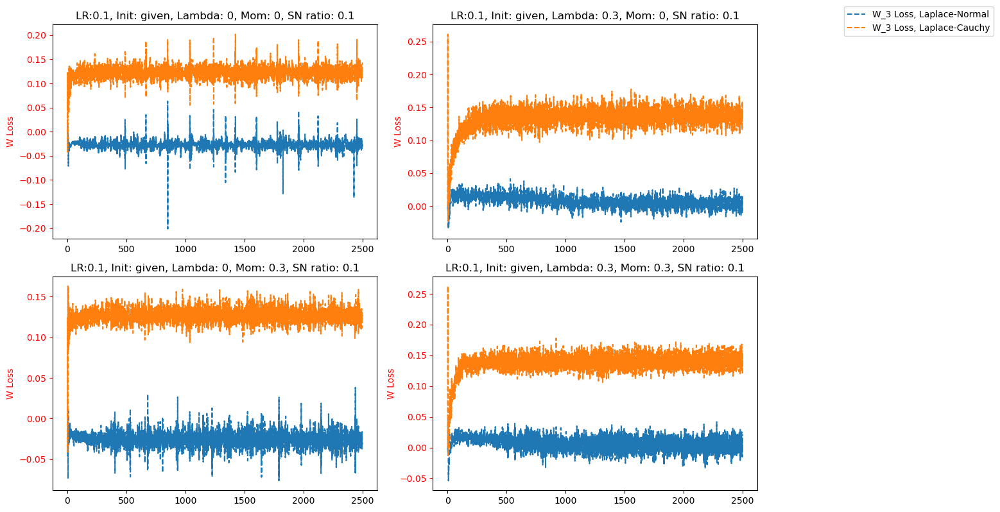

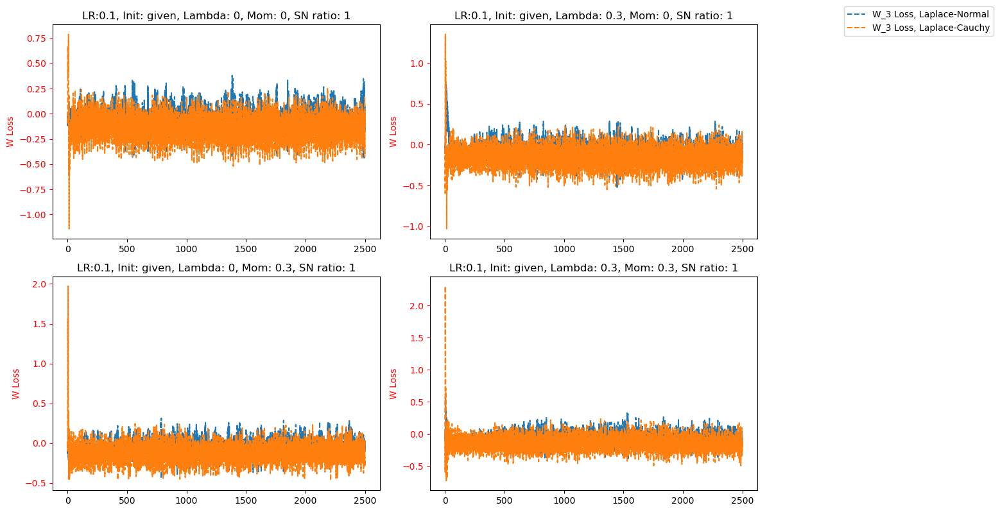

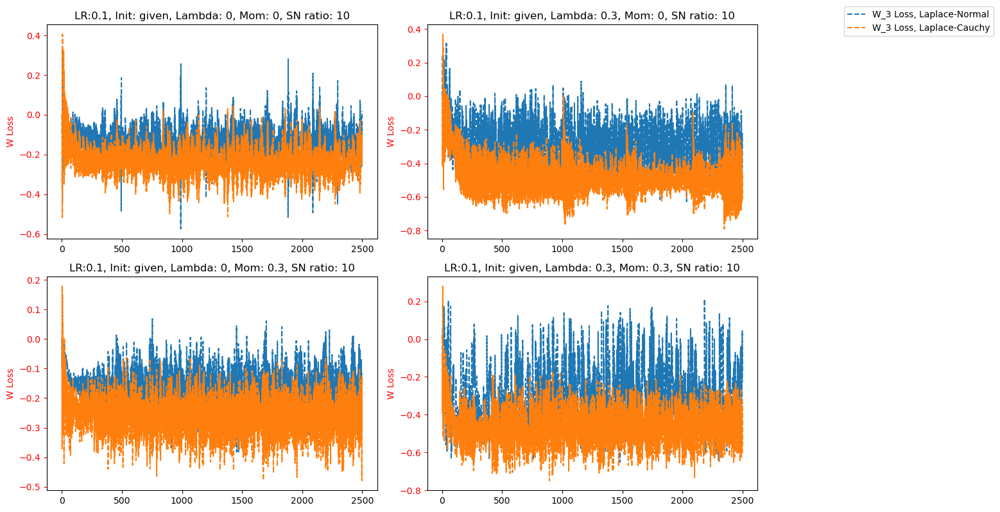

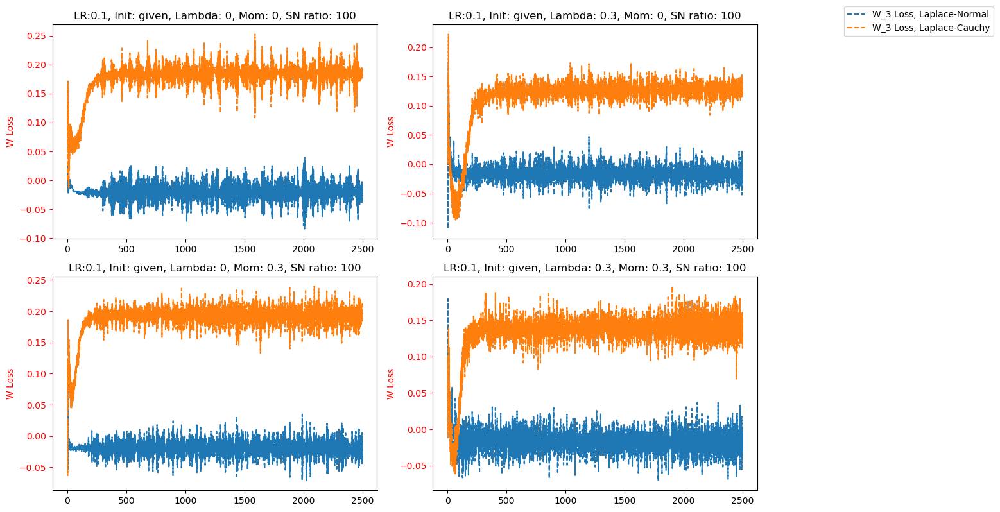

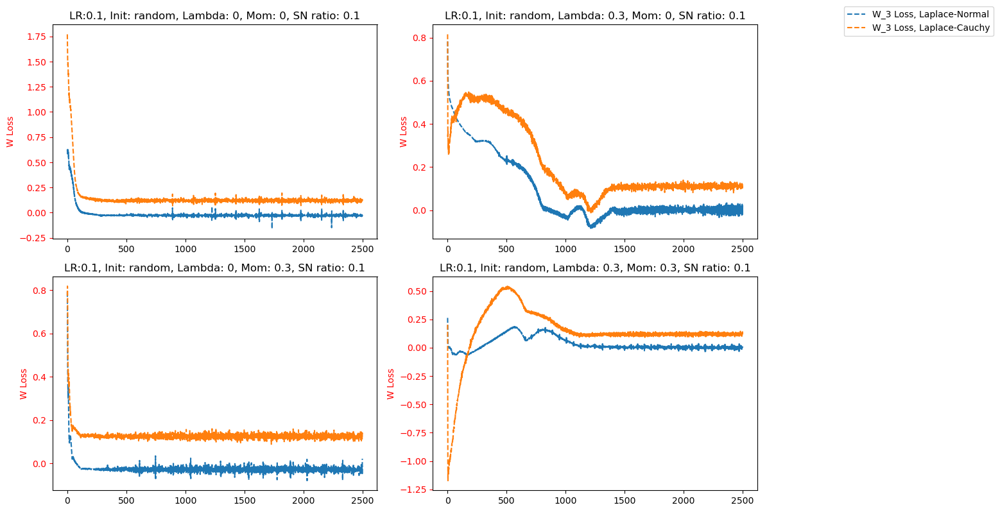

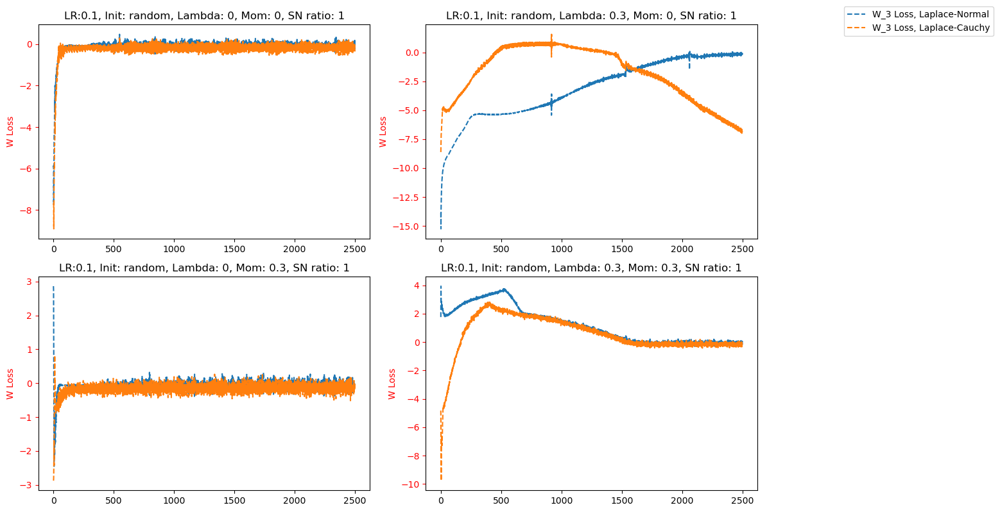

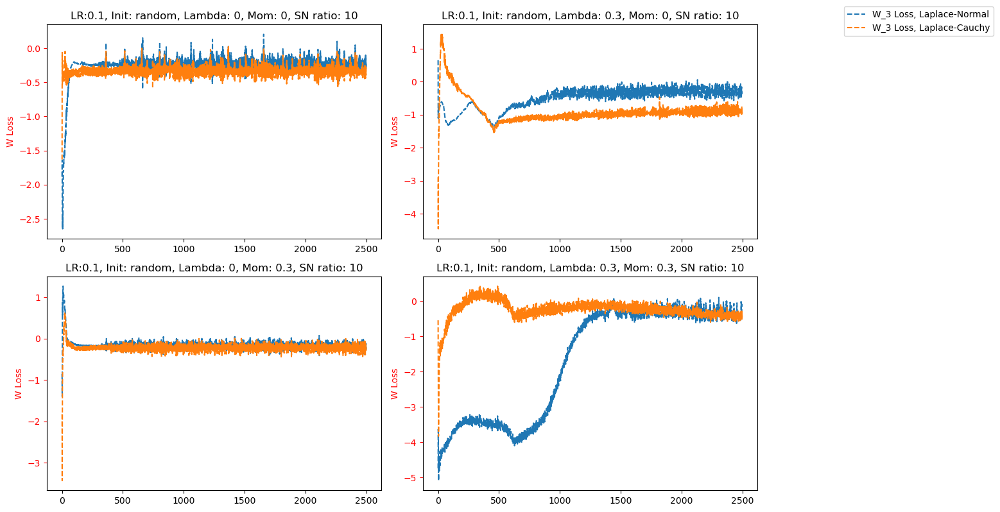

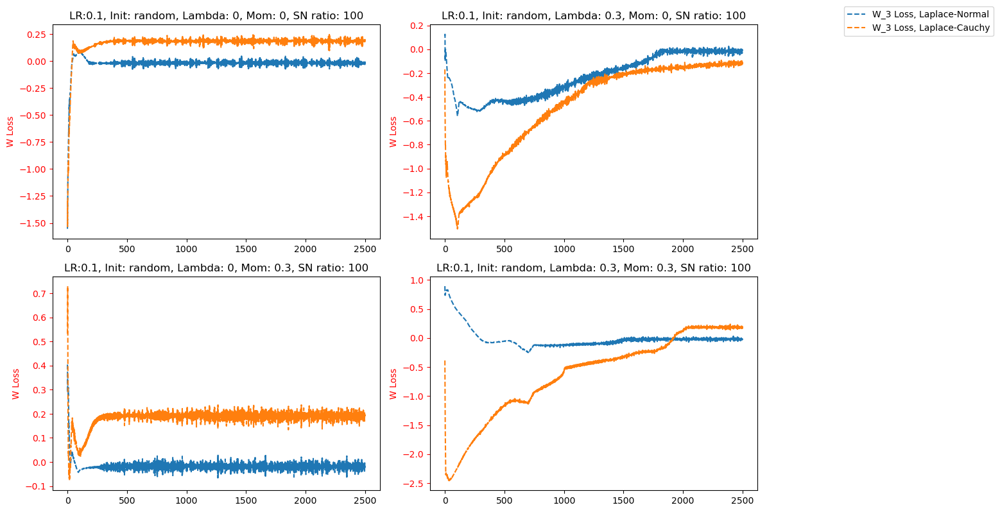

In [356]:
loss_datas = [l_data_lap, l_data_nor, l_data_cau] 
w_loss_datas = [w_l_data_lap, w_l_data_nor, w_l_data_cau]
inits = w_inits
w_true = [w_t_distr, w_t_distr, w_t_distr]
w_of_int = [3]
lrs= [0.1]

N = epochs
x = range(epochs-N, epochs)


for llr, lr in enumerate(lrs):
    for l, ll in enumerate(inits):
        for m, mm in enumerate(stn_ratios):            
            fig, axs = plt.subplots(len(moms), len(lambdas), figsize=(12, 8))
            #print(f' True coefficients : {w_true[2:4]}, loss 2stlq: {w_2stg}')
            #print(f' True coefficients : {w_true[w_of_int]}')

            # Create a list to store legend handles and labels
            legend_handles, legend_labels = [], []
            lines = []

            for i in range(len(moms)):
                for j in range(len(lambdas)):

                    
                    # Plot on the current subplot
                    ax1 = axs[i, j]                    
                    w_t = w_true[0]
                    for d_count in range(1,3):
                        for k in w_of_int:
                            ww = torch.Tensor(epochs)
                            for e in range(epochs):
                                ww[e] = ((w_loss_datas[0][:,llr, m, l, k, i, j, e]/w_t[:, llr, m,  l, k]).abs()-(w_loss_datas[d_count][:,llr, m, l, k, i, j, e]/w_t[:, llr, m,  l, k]).abs()).mean()

                            line2, = ax1.plot(x, ww.detach().numpy(), linestyle='--', label=f'W_{k} Loss, {diss[0]}-{diss[d_count]}')
                            lines.append(line2)
                        ax1.set_ylabel('W Loss', color='r')
                        ax1.tick_params('y', colors='r')



                    ax1.set_title(f'LR:{lr}, Init: {ll}, Lambda: {lambdas[j]}, Mom: {moms[i]}, SN ratio: {mm}')
                    #print(f'Lambda: {lambdas[j]}, Mom: {moms[i]}, Loss at minimum : {(w_loss_data[w_of_int,i,j,loss_data[i, j, :].argmin()]/w_true[k]).abs()}')

            # Create a common legend outside the subplots
            # Extend the legend handles and labels

            legend_handles.extend(lines)
            legend_labels.extend([f'W_{k} Loss, {diss[0]}-{diss[d_count]}' for k in w_of_int for d_count in range(1,3)])
            fig.legend(legend_handles, legend_labels, bbox_to_anchor=(0.8, 0.5, 0.5, 0.5))


            # Adjust layout and display the plots
            plt.tight_layout()
            plt.show()

# Real Data

In [248]:
import networkx as nx
import numpy as np
import torch
from torch.nn import Parameter
import matplotlib.pyplot as plt
import random 
import math
import os
import pandas as pd

In [250]:
col_names = [
    "ID", "CHAIN", "CO_OWNED", "STATE",
    "SOUTHJ", "CENTRALJ", "NORTHJ", "PA1",
    "PA2", "SHORE",
    "NCALLS", "EMPFT", "EMPPT", "NMGRS",
    "WAGE_ST", "INCTIME", "FIRSTINC",
    "BONUS", "PCTAFF", "MEALS", "OPEN",
    "HRSOPEN", "PSODA", "PFRY", "PENTREE",
    "NREGS", "NREGS11",
    "TYPE2", "STATUS2", "DATE2", "NCALLS2",
    "EMPFT2", "EMPPT2", "NMGRS2", "WAGE_ST2",
    "INCTIME2", "FIRSTIN2", "SPECIAL2", "MEALS2",
    "OPEN2R", "HRSOPEN2", "PSODA2", "PFRY2",
    "PENTREE2", "NREGS2", "NREGS112"
]

col_names_pre = [
    "ID", "CHAIN", "CO_OWNED", "STATE",
    "SOUTHJ", "CENTRALJ", "NORTHJ", "PA1",
    "PA2", "SHORE",
    "EMPFT", "EMPPT",
    "WAGE_ST", "INCTIME", "FIRSTINC",
    "OPEN", "HRSOPEN", "PSODA", "PFRY", 
    "PENTREE"
]

col_names_post = [
    "ID", "CHAIN", "CO_OWNED", "STATE",
    "SOUTHJ", "CENTRALJ", "NORTHJ", "PA1",
    "PA2", "SHORE",
    "EMPFT2", "EMPPT2", 
    "WAGE_ST2", "INCTIME2", "FIRSTIN2",
    "OPEN2R", "HRSOPEN2", "PSODA2", "PFRY2",
    "PENTREE2"
]

In [253]:
file = "public.dat"
file_path = os.path.join(os.getcwd(), file)
df = pd.read_table(file_path, delim_whitespace=True, names=col_names, na_values='.')

rate = 0.5
df["EMPL1"] = df["EMPFT"] + df["EMPPT"]*rate
df["EMPL2"] = df["EMPFT2"] + df["EMPPT2"] * rate

mask = df["EMPL1"]==0
mask = ~mask
df = df[mask]
mask = df["EMPL2"]==0
mask = ~mask
df = df[mask]
df = df.drop(["ID", "CHAIN", "EMPFT", "EMPPT"], axis=1)
mask = df.isnull().any(axis=1) | df.isnull().any(axis=1)
mask = ~mask
df = df.dropna(axis=0)

df = df[["EMPL1", "STATE", "EMPL2"]]
df = df - df.mean()
data = torch.tensor(df.values, dtype=torch.float)


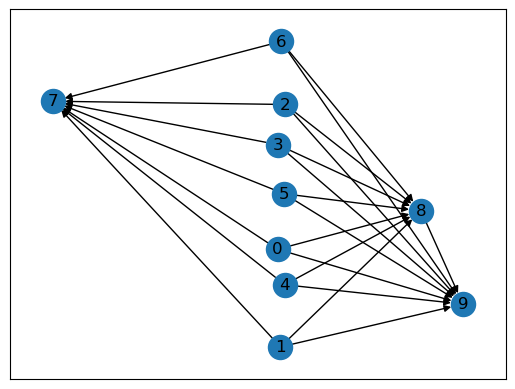

In [311]:
adj_did = np.array([[0,0,0,0,0,0,0,1,1,1],[0,0,0,0,0,0,0,1,1,1],[0,0,0,0,0,0,0,1,1,1], [0,0,0,0,0,0,0,1,1,1], [0,0,0,0,0,0,0,1,1,1], [0,0,0,0,0,0,0,1,1,1], [0,0,0,0,0,0,0,1,1,1],[0,0,0,0,0,0,0,0,0,0],[0,0,0,0,0,0,0,0,0,1],[0,0,0,0,0,0,0,0,0,0]])
g_did = nx.DiGraph(adj_did)
nx.draw_networkx(g_did)
latent = 7
observed = 3

In [312]:
moms = [0, 0.3]
lambdas = [0, 0.5, 1, 10]

In [317]:
loss_data_real, w_loss_data_real = graphical_rica(withening = False, pseudoinv = True, latent = latent, observed = observed, g = g_did, data = data, moms = moms, 
                                                                                                                   lambdas = lambdas, epochs = epochs, lr = lr,
                                                                                                                   w_init = 'random', cti_sd = 1) 

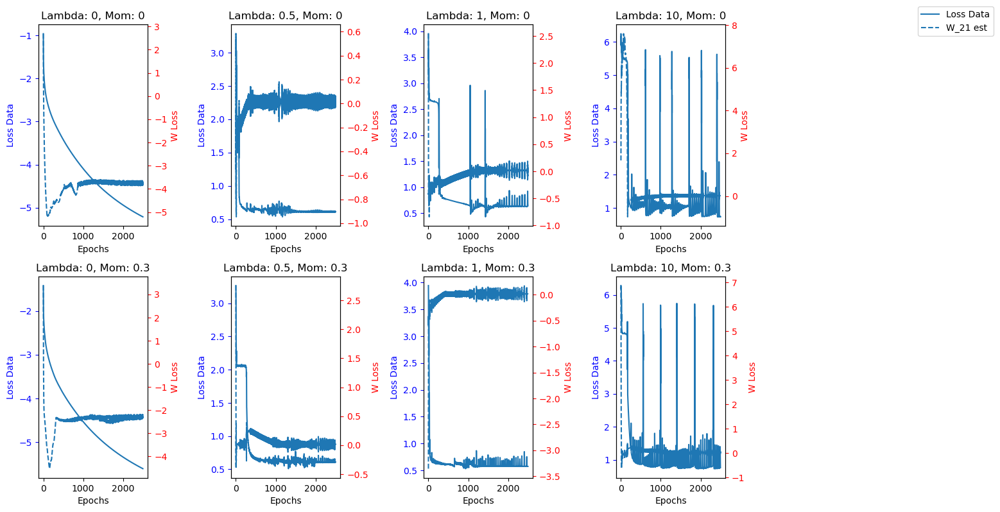

In [319]:
loss_datas = [loss_data_real] 
w_loss_datas = [w_loss_data_real]
inits = ['random']
w_of_int = [len(g_did.edges())-1]
lrs= [0.1]

N = epochs
x = range(epochs-N, epochs)

dic = [True, False]

fig, axs = plt.subplots(len(moms), len(lambdas), figsize=(12, 8))
#print(f' True coefficients : {w_true[2:4]}, loss 2stlq: {w_2stg}')
#print(f' True coefficients : {w_true[w_of_int]}')

# Create a list to store legend handles and labels
legend_handles, legend_labels = [], []
lines = []

for i in range(len(moms)):
    for j in range(len(lambdas)):


        # Plot on the current subplot
        ax1 = axs[i, j]
        for l_enum, loss_data in enumerate(loss_datas):
            line1, = ax1.plot(x, loss_data[i, j, :].log().detach().numpy(), '-', label=f'Loss Data, SV = {dic[l_enum]}')
            lines.append(line1)
        ax1.set_xlabel('Epochs')
        ax1.set_ylabel('Loss Data', color='b')
        ax1.tick_params('y', colors='b')

        # Create a second y-axis on the same subplot
        ax2 = ax1.twinx()

        for w_l_enum, w_loss_data in enumerate(w_loss_datas):
            w_t = w_true[w_l_enum]
            for k in w_of_int:
                ww = torch.Tensor(epochs)
                for e in range(epochs):
                    ww[e] = (w_loss_data[k, i, j, e])

                line2, = ax2.plot(x, ww.detach().numpy(), linestyle='--', label=f'W_{k} Loss, SV = {dic[w_l_enum]} ')
                lines.append(line2)
        ax2.set_ylabel('W Loss', color='r')
        ax2.tick_params('y', colors='r')



        ax1.set_title(f'Lambda: {lambdas[j]}, Mom: {moms[i]}')
        #print(f'Lambda: {lambdas[j]}, Mom: {moms[i]}, Loss at minimum : {(w_loss_data[w_of_int,i,j,loss_data[i, j, :].argmin()]/w_true[k]).abs()}')

# Create a common legend outside the subplots
# Extend the legend handles and labels

legend_handles.extend(lines)
legend_labels.extend([f'Loss Data'] + [f'W_{k} est'])
fig.legend(legend_handles, legend_labels, bbox_to_anchor=(0.8, 0.5, 0.5, 0.5))


# Adjust layout and display the plots
plt.tight_layout()
plt.show()

# New Graph

In [67]:
adj = #np.array([...]) order the graph in such a way that all the hidden nodes come first
g = nx.DiGraph(adj)
nx.draw_networkx(g)
latent = # Number of Latent Variables
observed = # Number of Observed Variables

SyntaxError: invalid syntax (2820093614.py, line 1)

In [68]:
w_inits = ['given', 'random']
diss = ['Laplace', 'Normal', 'Cauchy']
s_vars = [False]
lambdas = [0, 0.3]
moms = [0, 0.3]
epochs = 2500
n = 1000
reps = 10
lrs= [0.1]

v_min = 0.2
v_max = 5

w_max = 5
stn_ratios = [0.1, 1, 10, 100]

lr = 0.1

l_data_lap = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(moms),len(lambdas),epochs)
w_l_data_lap = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(g_did.edges()),len(moms),len(lambdas),epochs)


l_data_nor = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(moms),len(lambdas),epochs)
w_l_data_nor = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(g_did.edges()),len(moms),len(lambdas),epochs)

l_data_cau = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(moms),len(lambdas),epochs)
w_l_data_cau = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(g_did.edges()),len(moms),len(lambdas),epochs)

w_t_distr = torch.zeros(reps, len(lrs), len(stn_ratios),len(w_inits), len(g_did.edges()))

In [ ]:
for r in range(reps):
    for l, stn_ratio in enumerate(stn_ratios):
        w_true, B_true = par_gen_weights(latent = latent,observed = observed, g= g_did, w_max = w_max)
        varr =  par_gen_var(latent = latent,observed = observed, g= g_did, same_var = s_var, v_min = v_min,
                                               v_max = v_max)
        for s, dis in enumerate(diss):
            data = hid_var_data(latent, observed, un_g ,n, B_true, distr = dis, varr = varr)
            for i, w_init in enumerate(w_inits):
                for j, lr in enumerate(lrs):
                    w_t_distr[r, j, l, i, :] = w_true
                    
                    if s == 0:
                        l_data_lap[r, j, l, i, :, :, :], w_l_data_lap[r,j, l, i,  : ,:, :, :] = graphical_rica(withening = True, pseudoinv = False, latent = latent, 
                                                                                                                   observed = observed, g = g_did, data = data, moms = moms, 
                                                                                                                   lambdas = lambdas, epochs = epochs, lr = lr,
                                                                                                                   w_init = w_init, w_true = w_true, cti_sd = 1) 
                    if s == 1:
                        l_data_nor[r,j, l, i, :, :, :], w_l_data_nor[r,j, l, i, : ,:, :, :] = graphical_rica(withening = True, pseudoinv = False, latent = latent, 
                                                                                                                      observed = observed, g = g_did, data = data, moms = moms, 
                                                                                                                      lambdas = lambdas, epochs = epochs, lr = lr,
                                                                                                                      w_init = w_init, w_true = w_true, cti_sd = 1) 
                        
                    if s == 2:
                        l_data_cau[r,j, l, i, :, :, :], w_l_data_cau[r,j, l, i, : ,:, :, :] = graphical_rica(withening = True, pseudoinv = False, latent = latent, 
                                                                                                                      observed = observed, g = g_did, data = data, moms = moms, 
                                                                                                                      lambdas = lambdas, epochs = epochs, lr = lr,
                                                                                                                      w_init = w_init, w_true = w_true, cti_sd = 1) 

In [ ]:
loss_datas = [l_data_lap, l_data_nor, l_data_cau] 
w_loss_datas = [w_l_data_lap, w_l_data_nor, w_l_data_cau]
w_true = [w_t_distr]*3
w_of_int = # parameters of interest
lrs= [0.1]


N = epochs

x = range(epochs-N, epochs)

for llr, lr in enumerate(lrs):
    for l, ll in enumerate(w_inits):
        for m, mm in enumerate(stn_ratios):            
            fig, axs = plt.subplots(len(moms), len(lambdas), figsize=(12, 8))
            #print(f' True coefficients : {w_true[2:4]}, loss 2stlq: {w_2stg}')
            #print(f' True coefficients : {w_true[w_of_int]}')

            # Create a list to store legend handles and labels
            legend_handles, legend_labels = [], []
            lines = []

            for i in range(len(moms)):
                for j in range(len(lambdas)):

                    
                    # Plot on the current subplot
                    ax1 = axs[i, j]
                    for l_enum, loss_data in enumerate(loss_datas):
                        line1, = ax1.plot(x, loss_data[:, llr, m, l, i, j, :].mean(0).log().detach().numpy(), '-', label=f'Loss Data, Init = {ll}')
                        lines.append(line1)
                    ax1.set_xlabel('Epochs')
                    ax1.set_ylabel('Loss Data', color='b')
                    ax1.tick_params('y', colors='b')
                    
                    # Create a second y-axis on the same subplot
                    ax2 = ax1.twinx()
                    
                    for w_l_enum, w_loss_data in enumerate(w_loss_datas):
                        w_t = w_true[w_l_enum]
                        for k in w_of_int:
                            ww = torch.Tensor(epochs)
                            for e in range(epochs):
                                ww[e] = (w_loss_data[:,llr, m, l, k, i, j, e]/w_t[:, llr, m,  l, k]).abs().mean()
                            
                            line2, = ax2.plot(x, ww.log().detach().numpy(), linestyle='--', label=f'W_{k} Loss, Init = {ll} ')
                            lines.append(line2)
                    ax2.set_ylabel('W Loss', color='r')
                    ax2.tick_params('y', colors='r')



                    ax1.set_title(f'LR:{lr}, Init: {ll}, Lambda: {lambdas[j]}, Mom: {moms[i]}, SN ratio: {mm}')
                    #print(f'Lambda: {lambdas[j]}, Mom: {moms[i]}, Loss at minimum : {(w_loss_data[w_of_int,i,j,loss_data[i, j, :].argmin()]/w_true[k]).abs()}')

            # Create a common legend outside the subplots
            # Extend the legend handles and labels

            legend_handles.extend(lines)
            legend_labels.extend([f'Loss Data, Init = {ll}'] + [f'W_{k} Loss, Init = {ll}' for k in w_of_int])
            fig.legend(legend_handles, legend_labels, bbox_to_anchor=(0.8, 0.5, 0.5, 0.5))


            # Adjust layout and display the plots
            plt.tight_layout()
            plt.show()

In [ ]:
loss_datas = [l_data_lap, l_data_nor, l_data_cau] 
w_loss_datas = [w_l_data_lap, w_l_data_nor, w_l_data_cau]
inits = w_inits
w_true = [w_t_distr, w_t_distr, w_t_distr]
w_of_int = #parameters of interest
lrs= [0.1]

N = epochs
x = range(epochs-N, epochs)


for llr, lr in enumerate(lrs):
    for l, ll in enumerate(inits):
        for m, mm in enumerate(stn_ratios):            
            fig, axs = plt.subplots(len(moms), len(lambdas), figsize=(12, 8))
            #print(f' True coefficients : {w_true[2:4]}, loss 2stlq: {w_2stg}')
            #print(f' True coefficients : {w_true[w_of_int]}')

            # Create a list to store legend handles and labels
            legend_handles, legend_labels = [], []
            lines = []

            for i in range(len(moms)):
                for j in range(len(lambdas)):

                    
                    # Plot on the current subplot
                    ax1 = axs[i, j]                    
                    w_t = w_true[0]
                    for d_count in range(1,3):
                        for k in w_of_int:
                            ww = torch.Tensor(epochs)
                            for e in range(epochs):
                                ww[e] = ((w_loss_datas[0][:,llr, m, l, k, i, j, e]/w_t[:, llr, m,  l, k]).abs()-(w_loss_datas[d_count][:,llr, m, l, k, i, j, e]/w_t[:, llr, m,  l, k]).abs()).mean()

                            line2, = ax1.plot(x, ww.detach().numpy(), linestyle='--', label=f'W_{k} Loss, {diss[0]}-{diss[d_count]}')
                            lines.append(line2)
                        ax1.set_ylabel('W Loss', color='r')
                        ax1.tick_params('y', colors='r')



                    ax1.set_title(f'LR:{lr}, Init: {ll}, Lambda: {lambdas[j]}, Mom: {moms[i]}, SN ratio: {mm}')
                    #print(f'Lambda: {lambdas[j]}, Mom: {moms[i]}, Loss at minimum : {(w_loss_data[w_of_int,i,j,loss_data[i, j, :].argmin()]/w_true[k]).abs()}')

            # Create a common legend outside the subplots
            # Extend the legend handles and labels

            legend_handles.extend(lines)
            legend_labels.extend([f'W_{k} Loss, {diss[0]}-{diss[d_count]}' for k in w_of_int for d_count in range(1,3)])
            fig.legend(legend_handles, legend_labels, bbox_to_anchor=(0.8, 0.5, 0.5, 0.5))


            # Adjust layout and display the plots
            plt.tight_layout()
            plt.show()